In [8]:
import pandas as pd
import re
import networkx as nx
from matplotlib import pyplot as plt
import more_itertools as mit
from collections import Counter
import typing

In [9]:
def prep_goals(list_goals):
    """Preprocesses DuRecDial goals for visualisation by leaving the first two words or renaming the goal.

    Used for preprocessing goals from DuRecDial annotation datasets. 
    Simplified for now, more preprocessing tbd later.

    Args:
        list_goals: A list of DuRecDial annotated dialogs.

    Returns:
        A list of preprocessed DuRecDial annotated dialogs.
    """

    list_prerpocessed = []
    for n, goal in enumerate(list_goals):
        goal_text = goal.split('_')[0]
        text_spl = goal_text.split()
        if len(text_spl) > 1:
            goal = ' '.join(text_spl[:2])
        if 'Q&' in goal_text:
            goal =  'Q&A about'
        if 'recommendation' in goal_text:
            goal =  'recommendation'
        list_prerpocessed.append(goal.split('_')[0]+ '_' + str(n))
    return list_prerpocessed

In [10]:
def get_node_weights(G: nx.Graph) -> typing.Dict[str, int]:
    """Get node weight for each node in graph.

    Weight calcuated as sum of all incoming edge weights.

    Args:
        G: a networkx graph.

    Returns:
        A dictionary of weights for each node.
    """

    node_weights = {}
    for node in G.nodes:
        weight = sum([d["weight"] for _, _, d in G.in_edges(node, data=True)]) + sum([d["weight"] for _, _, d in G.out_edges(node, data=True)])
        node_weights[node] = weight
    return node_weights


def get_nodes(dict_goal):
    """Get node weight for each node in graph.

    Weight calcuated as sum of all incoming edge weights.

    Args:
        G: a networkx graph.

    Returns:
        A dictionary of weights for each node.
    """

    # set_nodes = set([item for sublist in dict_goal.keys() for item in sublist])
    list_nodes = [item for sublist in dict_goal.keys() for item in sublist]
    nodes_positions = {}
    for node in list_nodes:
        position = node.split('_')[1]
        if position not in nodes_positions:
            nodes_positions[position] = [node]
        else:
            if node not in nodes_positions[position]:
                nodes_positions[position].append(node)
    return nodes_positions


# def position_nodes(G, nodes_dict):
#     node_weights = get_node_weights(G)
#     pos = {}
#     for key, value in nodes_dict.items():
#         sorted_nodes = sorted(value, key=lambda x: node_weights[x], reverse=True)
#         y_coord = 0
#         for node in sorted_nodes:
#             pos[node] = (int(key), y_coord)
#             y_coord += 1
#     return pos


def calculate_node_weights(G: nx.Graph) -> typing.Dict[str, int]:
    """Get node weight for each node in graph.

    Weight calcuated as sum of all incoming edge weights.

    Args:
        G: a networkx graph.

    Returns:
        A dictionary of weights for each node.
    """
    
    node_weights = {}
    for (node1, node2, data) in G.edges(data=True):
        if node2 not in node_weights:
            node_weights[node2] = data['weight']
        else:
            node_weights[node2] += data['weight']
    return node_weights

In [11]:
def give_path_ids(dialog, path_ids):
    output = [dialog[0]]
    for i in range(1, len(dialog)):
        path = tuple(dialog[: i])
        if path not in path_ids:
            path_ids[path] = len(path_ids)
        output.append(str(path_ids[path]) + ' | ' + dialog[i])
    return output

def make_dialog_dict(lists_goals, list_first_goals, small_nodes=False, use_ids=False):
    dialog_dict = {}
    path_ids = {}
    for goal in list_first_goals:
        goal_chunks = []
        for dialog in lists_goals:
            if dialog[0] == goal:
                if use_ids:
                    proceed_dialog = give_path_ids(dialog, path_ids)
                else:
                    proceed_dialog = dialog
                chunks = [x for x in list(mit.windowed(proceed_dialog, n=2, step=1, fillvalue='end_1')) if not ('nan' in x[0] and 'nan' in x[1])]
                goal_chunks += chunks
        dialog_dict[goal] = dict(Counter(goal_chunks))
        if not small_nodes:
            dialog_dict[goal] = {k: v for k, v in dialog_dict[goal].items() if v >= 5}
    return dialog_dict

In [12]:
def draw_graph(one_start, size=(18,12)):
    if one_start:
        if len(one_start.keys()) > 1:
                plt.figure(figsize=size)
                G=nx.DiGraph()
                nodes_dict = get_nodes(one_start)
                for key, value in nodes_dict.items():
                        y_coord = 0
                        for node in sorted(value):
                                G.add_node(node, pos=(int(key),y_coord))
                                y_coord += 1
                for key, value in one_start.items():
                        G.add_edge(key[0], key[1], weight=value)
                widths = nx.get_edge_attributes(G, 'weight')
                node_weights = calculate_node_weights(G)
                max_weight = max(node_weights.values())
                min_node_size = 100
                max_node_size = 1000
                for node in G.nodes():
                        G.nodes[node]['size'] = max_node_size
                for node, weight in node_weights.items():
                        node_size = min_node_size + (max_node_size - min_node_size) * (weight / max_weight)
                        G.nodes[node]['size'] = node_size
                nodelist = G.nodes()
                print(dict(zip(nodelist,nodelist)))
                # pos = position_nodes(G, nodes_dict)
                dict_labels = dict(zip(nodelist,[x.split('|')[1].strip() if '|' in x else x for x in nodelist]))
                pos = nx.nx_agraph.graphviz_layout(G, prog='dot', args='-Grankdir=LR')
                nx.draw_networkx_nodes(G,pos,
                                nodelist=nodelist,
                                node_size=[G.nodes[node]['size'] for node in nodelist],
                                node_color='lightblue',
                                alpha=0.7)
                nx.draw_networkx_edges(G,pos,
                                edgelist = widths.keys(),
                                width=[x if x < 5 else 5 for x in list(widths.values())],
                                edge_color='lightblue',
                                alpha=0.6,
                                arrowstyle='->,head_width=0.2,head_length=2')
                nx.draw_networkx_labels(G, pos=pos,
                                        labels=dict_labels,
                                        font_color='black',
                                        font_size=8)
                nx.draw_networkx_edge_labels(G,pos, 
                                        edge_labels ={(n1,n2): widths[n1,n2] for (n1,n2) in widths if widths[n1,n2] >=5},
                                        font_color='black',
                                        font_size=7)
                plt.box(False)
                plt.show()

In [14]:
data = pd.read_csv('dialog_data/processed/durec_fin.tsv', sep='\t')
d_as_goals = [x.split(': ')[1] for x in set(data['id_and_goal'])]
number = re.compile(r'\[\d+\]')
lists_goals = [re.split(number, x) for x in d_as_goals]
lists_goals = [prep_goals([x.strip() for x in y if x]) for y in lists_goals]
list_first_goals = set(x[0] for x in lists_goals)
lists_goals = [[goal for goal in dialog if int(goal.split('_')[1]) < 6 and 'nan' not in goal] for dialog in lists_goals]
dialog_dict = make_dialog_dict(lists_goals, list_first_goals)
dialog_dict_full = make_dialog_dict(lists_goals, list_first_goals, small_nodes=True)

## Extras; DuRecDial with all goals including rare

{'Q&A about_0': 'Q&A about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1'}


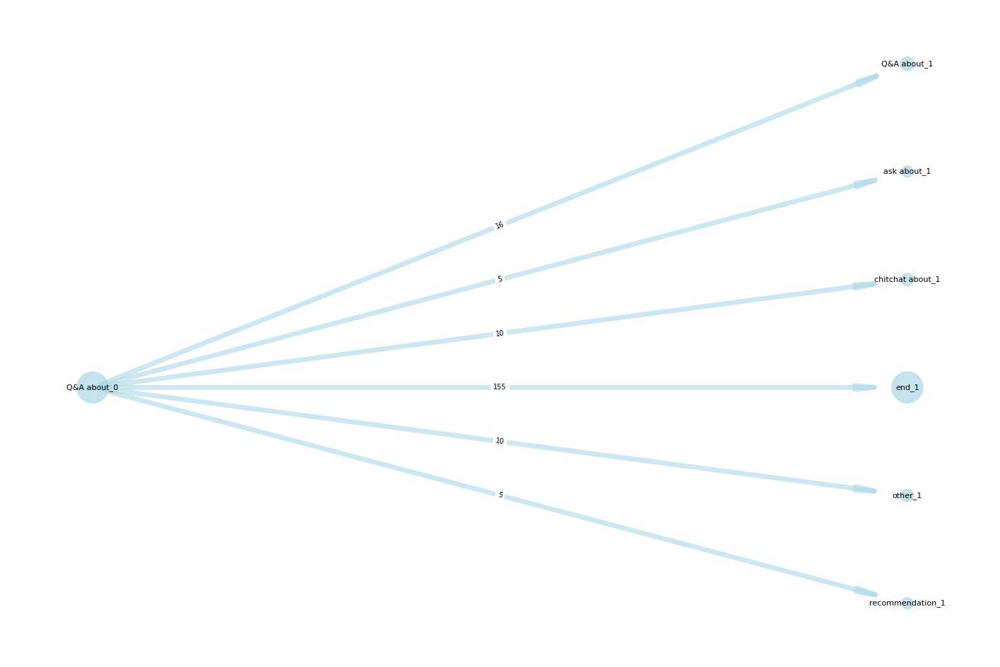

{'other_0': 'other_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'end_1': 'end_1', 'greeting_1': 'greeting_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'other_2': 'other_2'}


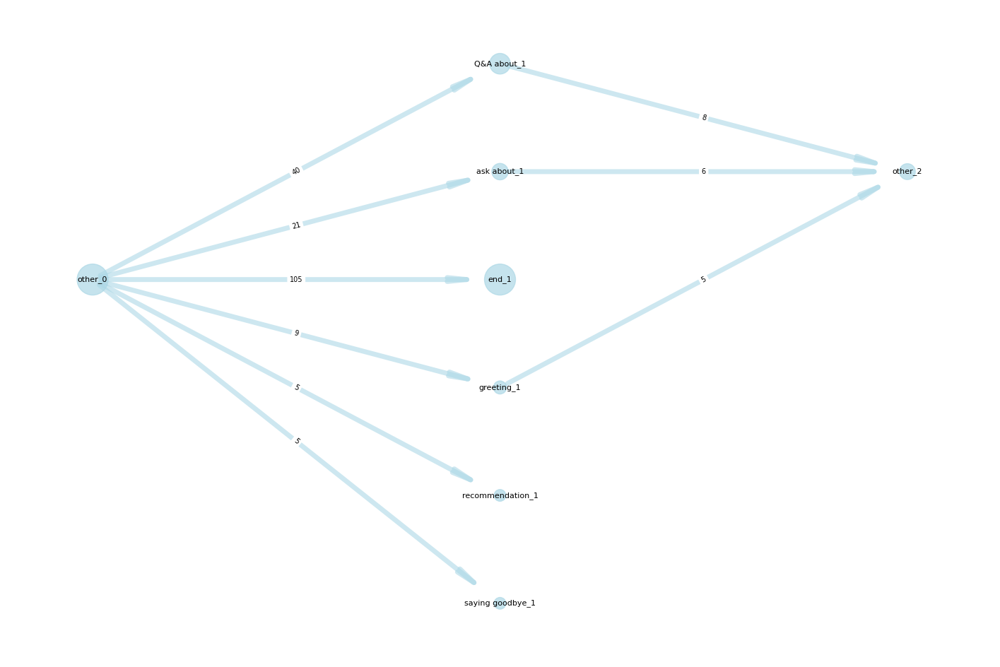

{'chitchat about_0': 'chitchat about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'end_1': 'end_1', 'recommendation_1': 'recommendation_1', 'chitchat about_2': 'chitchat about_2'}


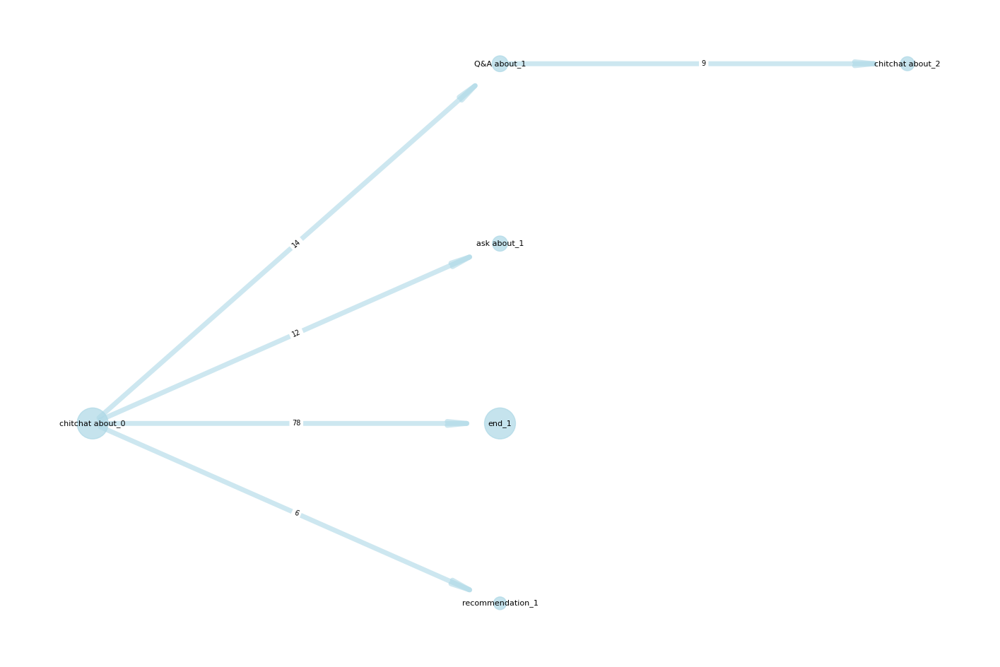

{'greeting_0': 'greeting_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'saying goodbye_2': 'saying goodbye_2', 'Q&A about_3': 'Q&A about_3', 'chitchat about_3': 'chitchat about_3', 'other_3': 'other_3'}


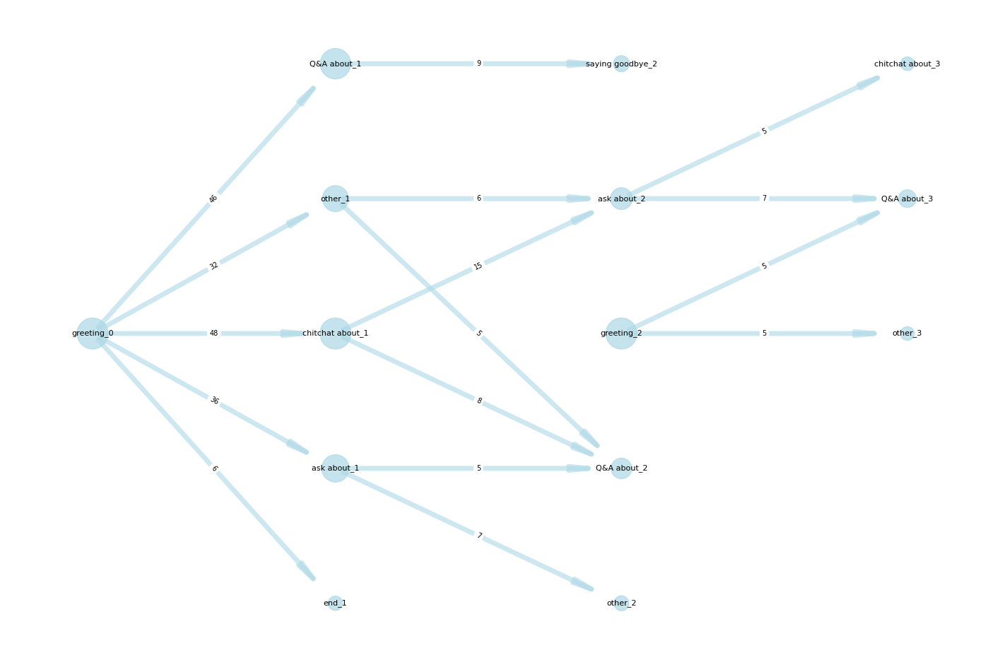

{'ask about_0': 'ask about_0', 'Q&A about_1': 'Q&A about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'ask about_2': 'ask about_2', 'chitchat about_2': 'chitchat about_2', 'Q&A about_3': 'Q&A about_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3'}


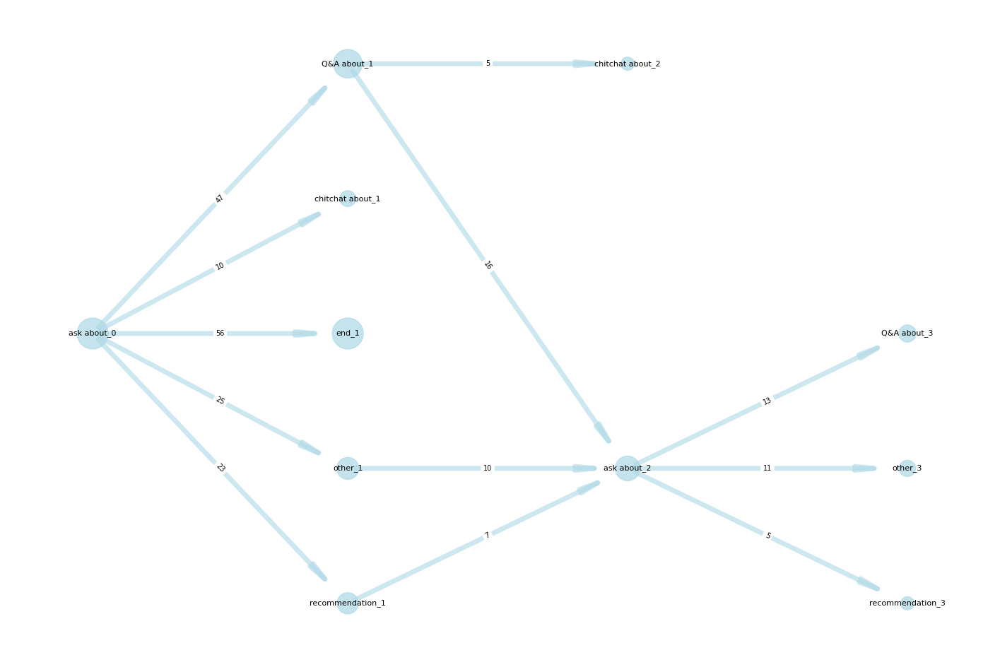

{'greeting, ask_0': 'greeting, ask_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'recommendation_1': 'recommendation_1'}


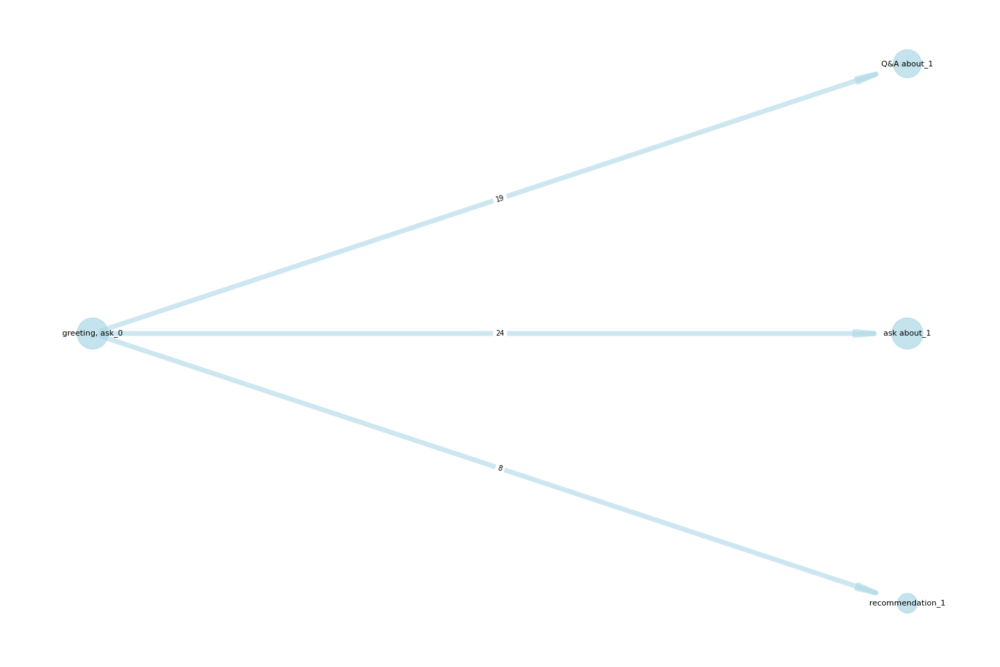

In [15]:
for dialog in dialog_dict:
        draw_graph(dialog_dict[dialog])

{'gossip_0': 'gossip_0', 'ask about_1': 'ask about_1', 'end_1': 'end_1', 'gossip_2': 'gossip_2'}


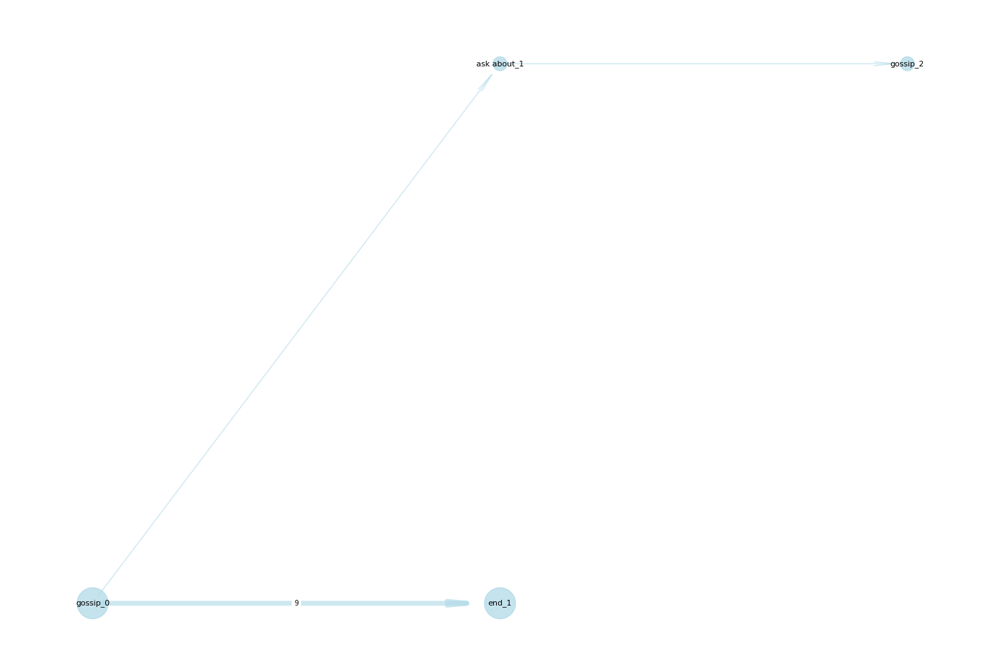

{'greeting, chitchat_0': 'greeting, chitchat_0', 'chitchat about_1': 'chitchat about_1', 'greeting_1': 'greeting_1', 'ask about_2': 'ask about_2', 'chitchat about_2': 'chitchat about_2', 'Q&A about_3': 'Q&A about_3', 'chitchat about_3': 'chitchat about_3', 'recommendation_3': 'recommendation_3', 'chitchat about_4': 'chitchat about_4', 'chitchat about_5': 'chitchat about_5'}


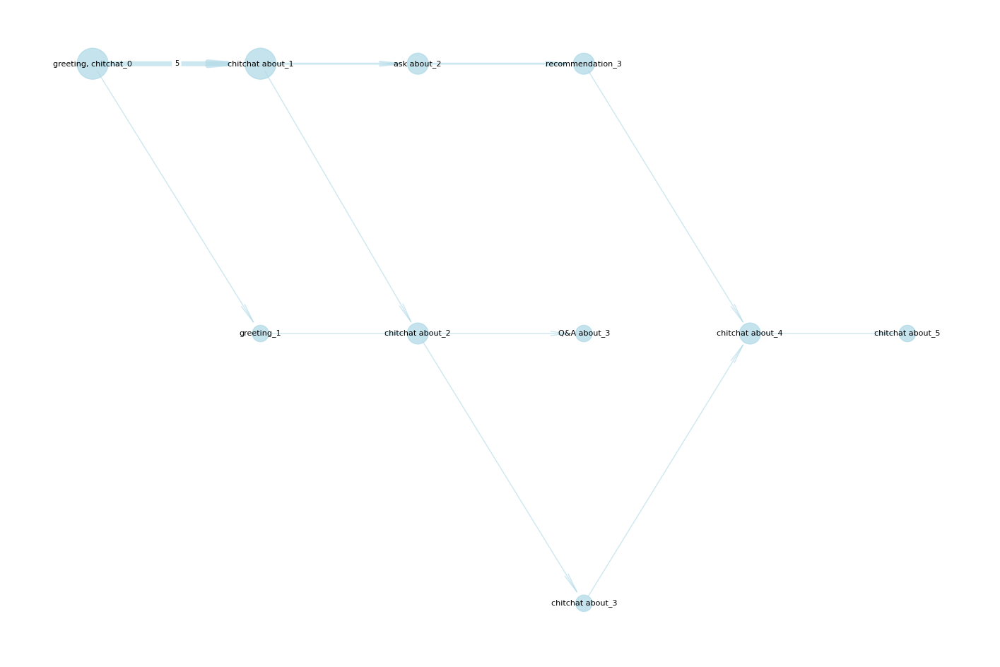

{'Q&A about_0': 'Q&A about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'greeting_1': 'greeting_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'chitchat about_2': 'chitchat about_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'recommendation_2': 'recommendation_2', 'saying goodbye_2': 'saying goodbye_2', 'Q&A about_3': 'Q&A about_3', 'ask about_3': 'ask about_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3', 'weather notification_3': 'weather notification_3', 'Q&A about_4': 'Q&A about_4', 'chitchat about_4': 'chitchat about_4', 'recommendation_4': 'recommendation_4', 'ask about_5': 'ask about_5'}


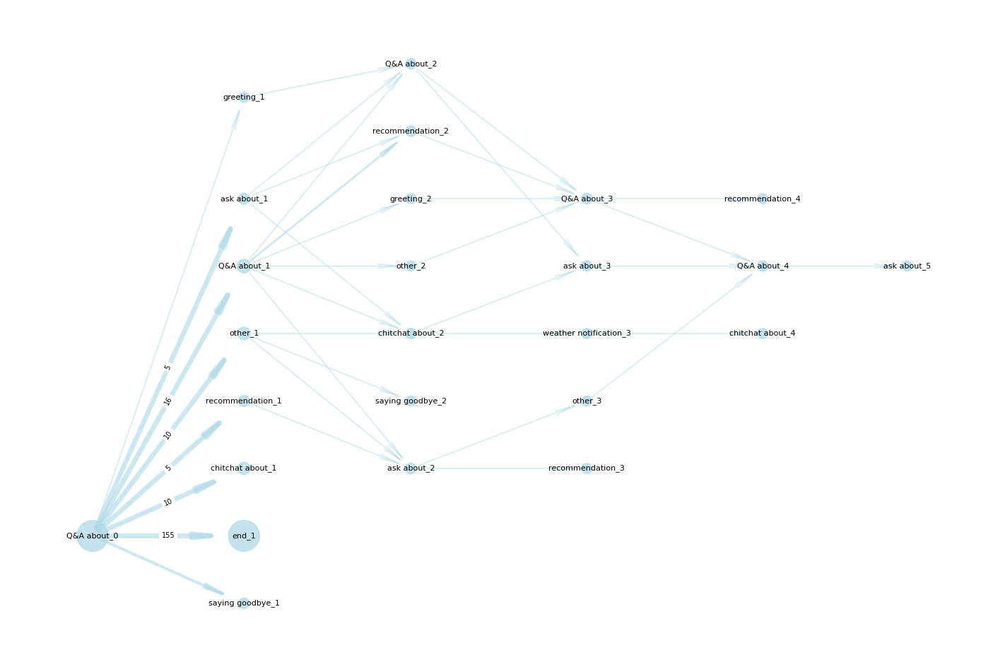

{'recommendation_0': 'recommendation_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chat about_1': 'chat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_2': 'recommendation_2', 'saying goodbye_2': 'saying goodbye_2', 'Q&A about_3': 'Q&A about_3'}


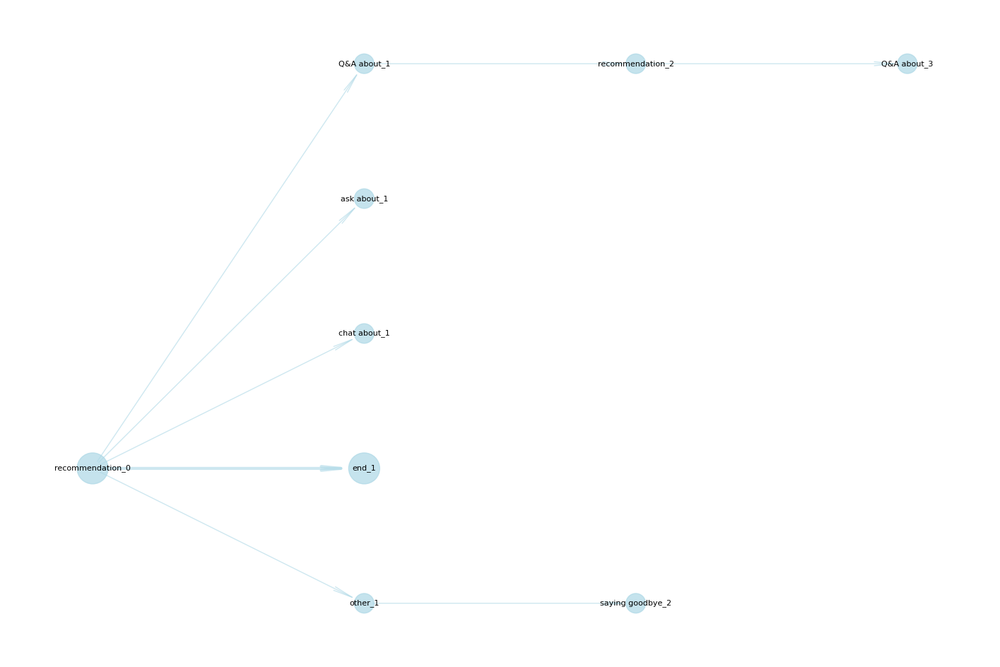

{'greeting, ask_0': 'greeting, ask_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'book return_1': 'book return_1', 'chitchat about_1': 'chitchat about_1', 'greeting_1': 'greeting_1', 'mural_1': 'mural_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'room reservation_1': 'room reservation_1', 'skate rental_1': 'skate rental_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'chat about_2': 'chat about_2', 'chitchat about_2': 'chitchat about_2', 'goals_2': 'goals_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'recommendation_2': 'recommendation_2', 'say goodbye_2': 'say goodbye_2', 'saying goodbye_2': 'saying goodbye_2', 'Q&A about_3': 'Q&A about_3', 'ask about_3': 'ask about_3', 'chitchat about_3': 'chitchat about_3', 'greeting_3': 'greeting_3', 'recommendation_3': 'recommendation_3', 'saying goodbye_3': 'saying goodbye_3', 'chitchat about_4': 'chitchat about_4', 'recommendation_4': 'recommendation_4', 'ask about_5': 'ask about_5'}

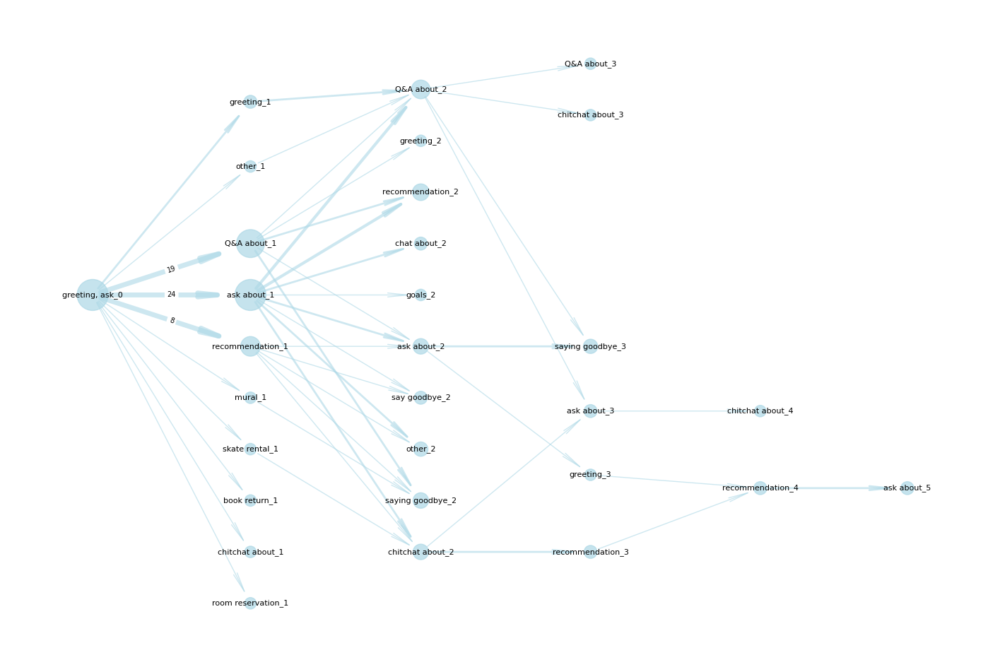

{'chitchat about_0': 'chitchat about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitch_1': 'chitch_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'weather notification_1': 'weather notification_1', 'Q&A about_2': 'Q&A about_2', 'chitchat about_2': 'chitchat about_2', 'recommendation_2': 'recommendation_2', 'ask about_3': 'ask about_3', 'chitchat about_3': 'chitchat about_3', 'recommendation_3': 'recommendation_3', 'Q&A about_4': 'Q&A about_4', 'chitchat about_4': 'chitchat about_4', 'recommendation_4': 'recommendation_4', 'ask about_5': 'ask about_5', 'recommendation_5': 'recommendation_5'}


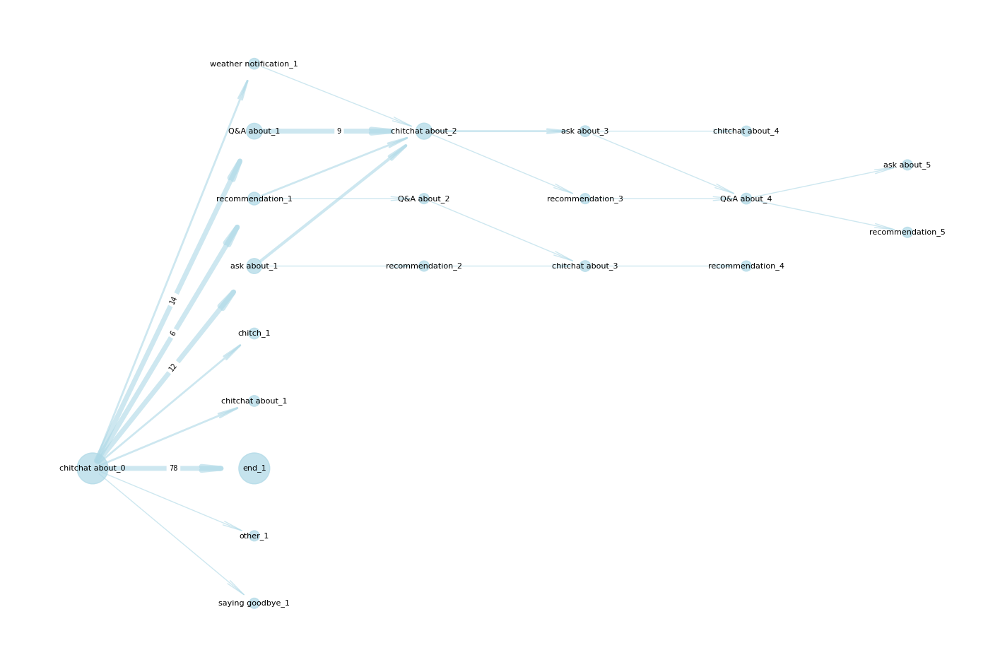

{'chat about_0': 'chat about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'recommendation_1': 'recommendation_1', 'chat about_2': 'chat about_2', 'recommendation_2': 'recommendation_2', 'chat about_3': 'chat about_3', 'recommendation_4': 'recommendation_4', 'chat about_5': 'chat about_5'}


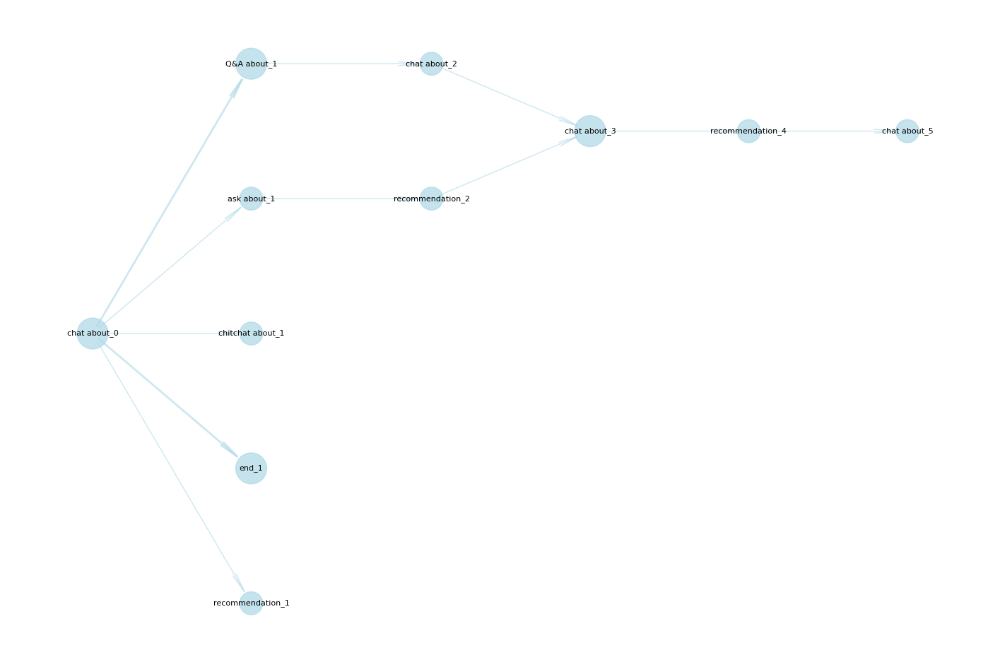

{'greeting, other_0': 'greeting, other_0', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'greeting_1': 'greeting_1', 'other_1': 'other_1', 'ask about_2': 'ask about_2', 'greeting, other_2': 'greeting, other_2', 'saying goodbye,_2': 'saying goodbye,_2', 'ask about_3': 'ask about_3'}


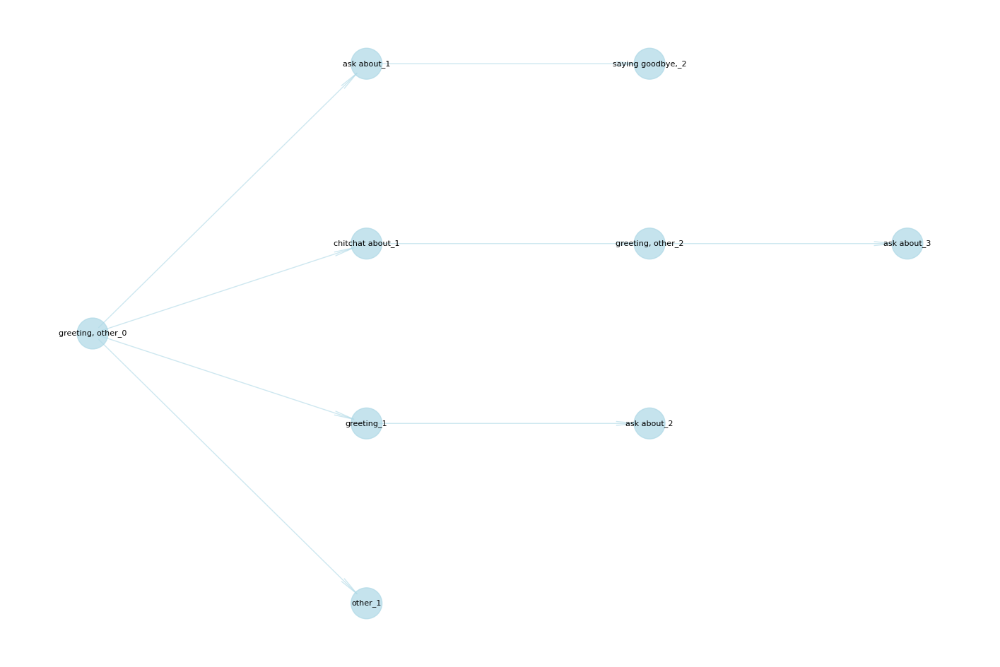

{'greeting, weather_0': 'greeting, weather_0', 'weather notification_1': 'weather notification_1', 'Q&A about_2': 'Q&A about_2'}


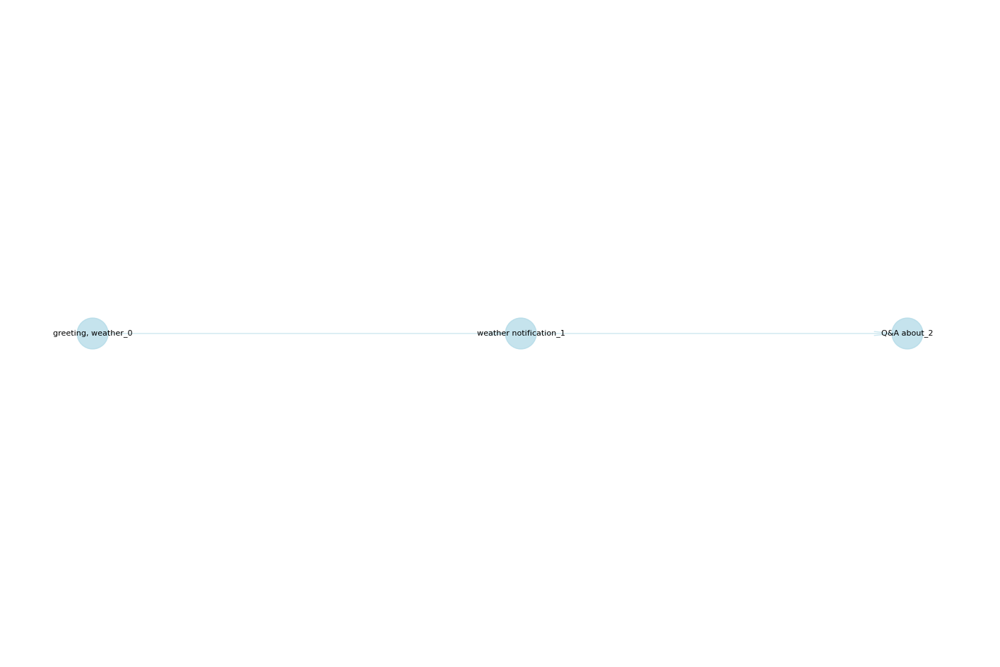

{'other_0': 'other_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'goals_1': 'goals_1', 'goodbye_1': 'goodbye_1', 'greeting, ask_1': 'greeting, ask_1', 'greeting_1': 'greeting_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'travel_1': 'travel_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'bank account_2': 'bank account_2', 'chat about_2': 'chat about_2', 'chitchat about_2': 'chitchat about_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'recommendation_2': 'recommendation_2', 'reservation_2': 'reservation_2', 'Q&A about_3': 'Q&A about_3', 'ask about_3': 'ask about_3', 'chitchat about_3': 'chitchat about_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3', 'saying goodbye_3': 'saying goodbye_3', 'Q&A about_4': 'Q&A about_4', 'ask about_4': 'ask about_4', 'other_4': 'other_4', 'recommendation_4': 'recommendation_4', 'ask about_5': 'ask about

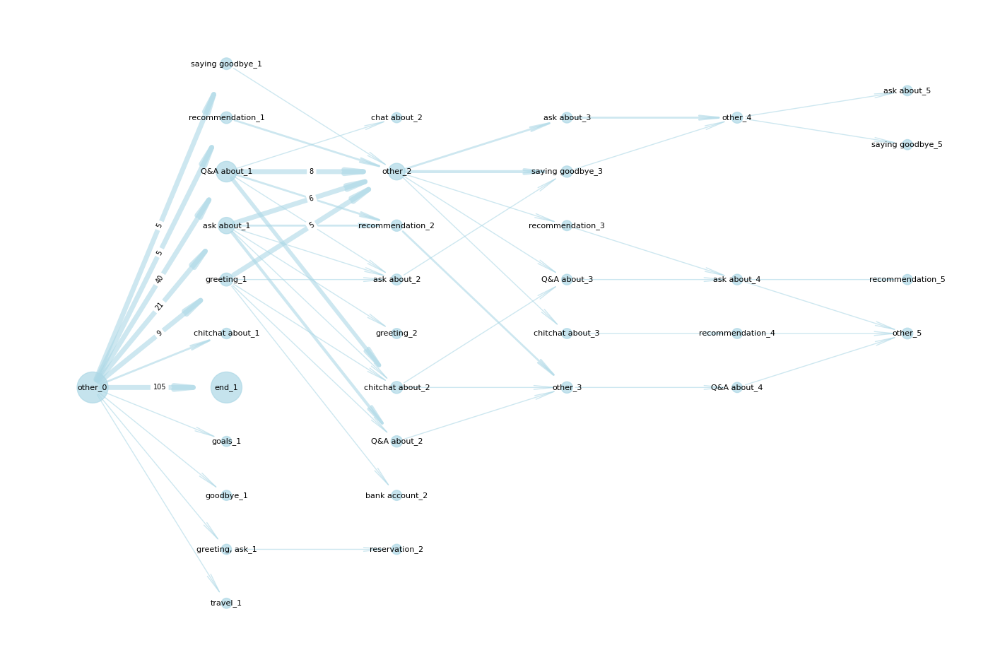

{'saying goodbye_0': 'saying goodbye_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'weather notification_1': 'weather notification_1', 'Q&A about_2': 'Q&A about_2', 'saying goodbye_2': 'saying goodbye_2'}


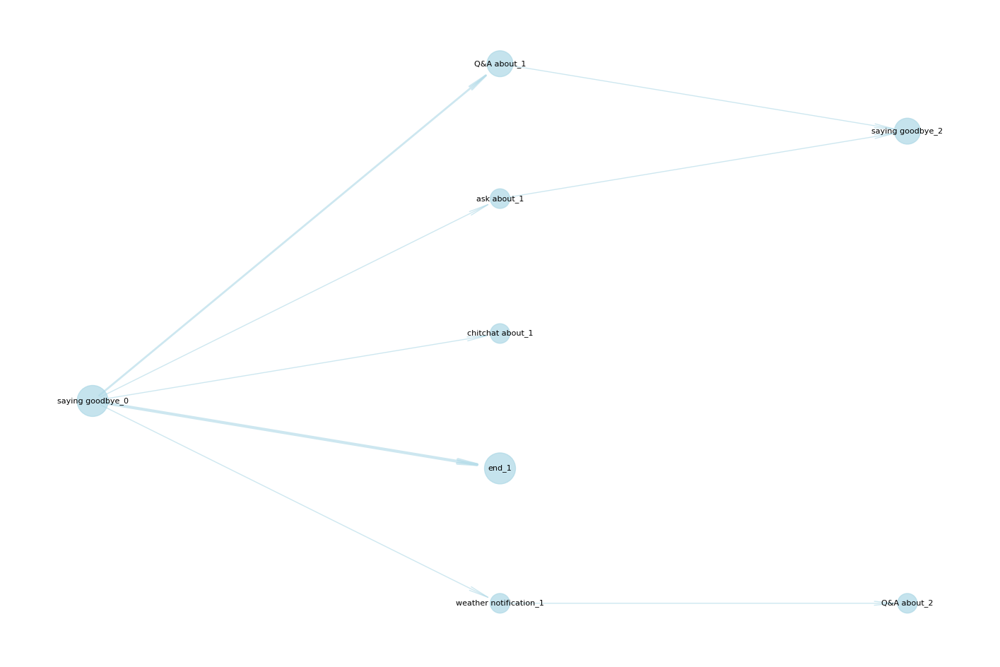

{'ask about_0': 'ask about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chat about_1': 'chat about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'gossip_1': 'gossip_1', 'greeting_1': 'greeting_1', 'hair cut_1': 'hair cut_1', 'job interview_1': 'job interview_1', 'order food_1': 'order food_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'say goodbye_1': 'say goodbye_1', 'saying goodbye_1': 'saying goodbye_1', 'travel_1': 'travel_1', 'weather notification_1': 'weather notification_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'chitchat about_2': 'chitchat about_2', 'other_2': 'other_2', 'recommendation_2': 'recommendation_2', 'saying goodbye_2': 'saying goodbye_2', 'weather notification_2': 'weather notification_2', 'Q&A about_3': 'Q&A about_3', 'ask about_3': 'ask about_3', 'chitchat about_3': 'chitchat about_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3', 'saying goodbye_3': 'saying goodbye_3', '

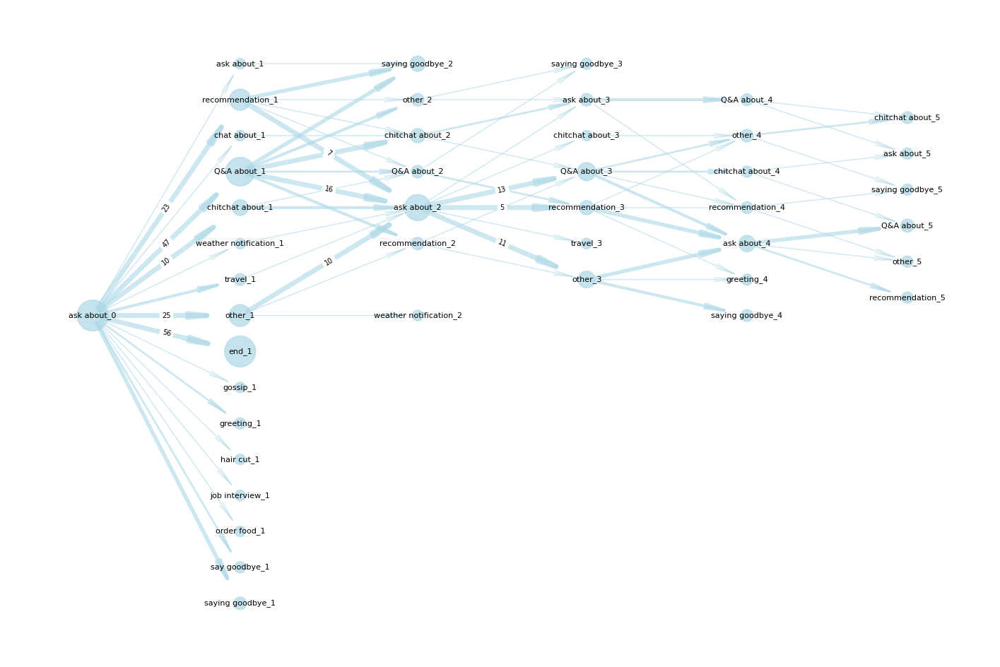

{'weather notification_0': 'weather notification_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chat about_1': 'chat about_1', 'end_1': 'end_1', 'ask about_2': 'ask about_2', 'chat about_2': 'chat about_2', 'ask about_3': 'ask about_3', 'chat about_3': 'chat about_3', 'chat about_4': 'chat about_4'}


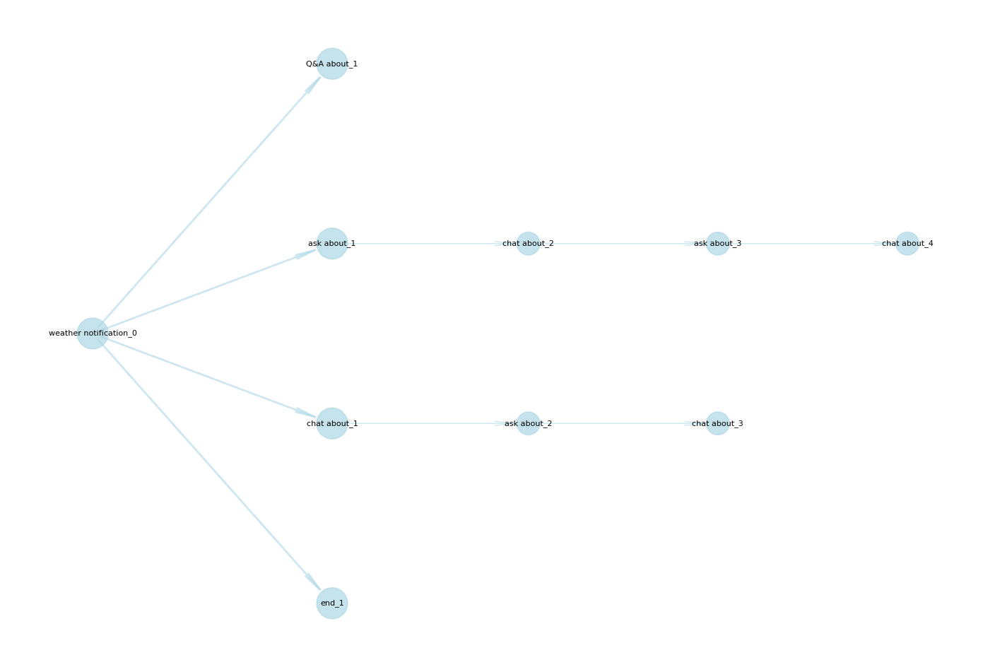

{'greeting_0': 'greeting_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'booking a_1': 'booking a_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'greeting, ask_1': 'greeting, ask_1', 'greeting, chitchat_1': 'greeting, chitchat_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'chat about_2': 'chat about_2', 'chitchat about_2': 'chitchat about_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'recommendation_2': 'recommendation_2', 'say goodbye_2': 'say goodbye_2', 'saying goodbye_2': 'saying goodbye_2', 'weather notification_2': 'weather notification_2', 'Q&A about_3': 'Q&A about_3', 'ask about_3': 'ask about_3', 'chitchat about_3': 'chitchat about_3', 'goals_3': 'goals_3', 'greeting_3': 'greeting_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3', 'saying goodbye_3': 'saying goodbye_3', 'travel reservation_3': 'travel res

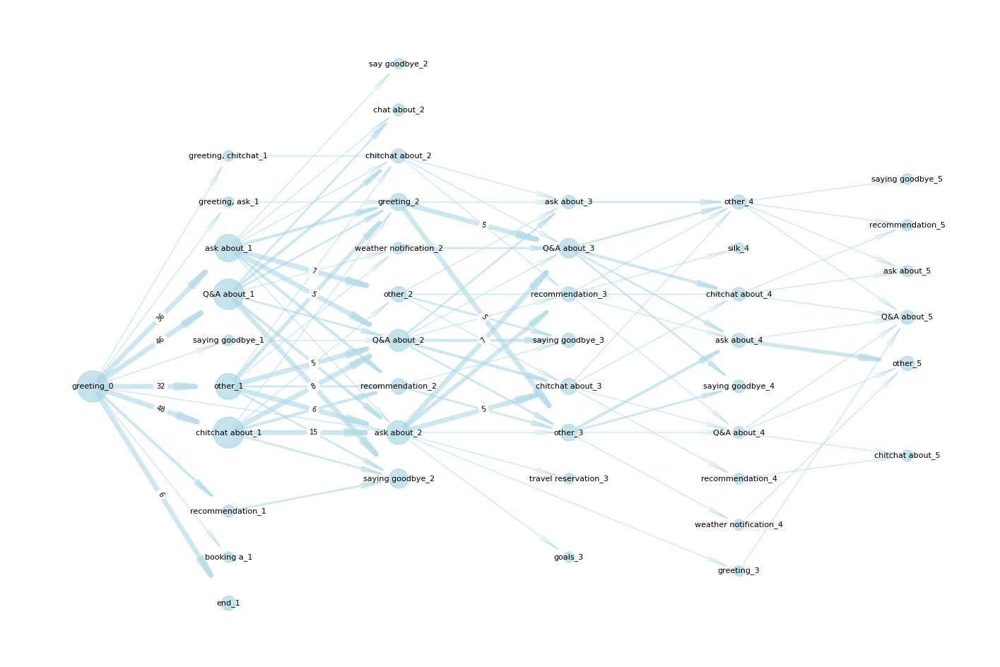

In [11]:
for dialog in dialog_dict_full:
    draw_graph(dialog_dict_full[dialog])

In [12]:
set_list_goals = ['greeting', 'Q&A', 'chitchat', 'ask', 'recommendation', 'weather', 'goodbye']

In [13]:
data = pd.read_csv('durec_fin.tsv', sep='\t')
d_as_goals = [x.split(': ')[1] for x in set(data['id_and_goal'])]
number = re.compile(r'\[\d+\]')
lists_goals = [re.split(number, x) for x in d_as_goals]
lists_goals = [prep_goals([x.strip() for x in y if x]) for y in lists_goals]
list_first_goals = set(x[0] for x in lists_goals)
lists_goals = [[goal for goal in dialog if int(goal.split('_')[1]) < 6 and 'nan' not in goal] for dialog in lists_goals]
lists_only_durec_goals = [[goal if any(item in goal for item in set_list_goals) else 'out of set_' + goal.split('_')[1] for goal in dialog] for dialog in lists_goals]
dialog_dict_full = make_dialog_dict(lists_only_durec_goals, list_first_goals, small_nodes=True)

In [15]:
# for dialog in dialog_dict_full:
#     print(dialog_dict_full[dialog])
#     draw_graph(dialog_dict_full[dialog])

In [39]:
data = pd.read_csv('durec_fin.tsv', sep='\t')
d_as_goals = [x.split(': ')[1] for x in set(data['id_and_goal'])]
number = re.compile(r'\[\d+\]')
lists_goals = [re.split(number, x) for x in d_as_goals]
lists_goals = [prep_goals([x.strip() for x in y if x]) for y in lists_goals]
list_first_goals = set(x[0] for x in lists_goals)
lists_goals = [[goal for goal in dialog if int(goal.split('_')[1]) < 6 and 'nan' not in goal] for dialog in lists_goals]
dialog_dict = make_dialog_dict(lists_goals, list_first_goals, use_ids=True)
dialog_dict_full = make_dialog_dict(lists_goals, list_first_goals, small_nodes=True, use_ids=True)

## DuRecDial, most often without out-of-set (edge weight > 5)

{'Q&A about_0': 'Q&A about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1'}


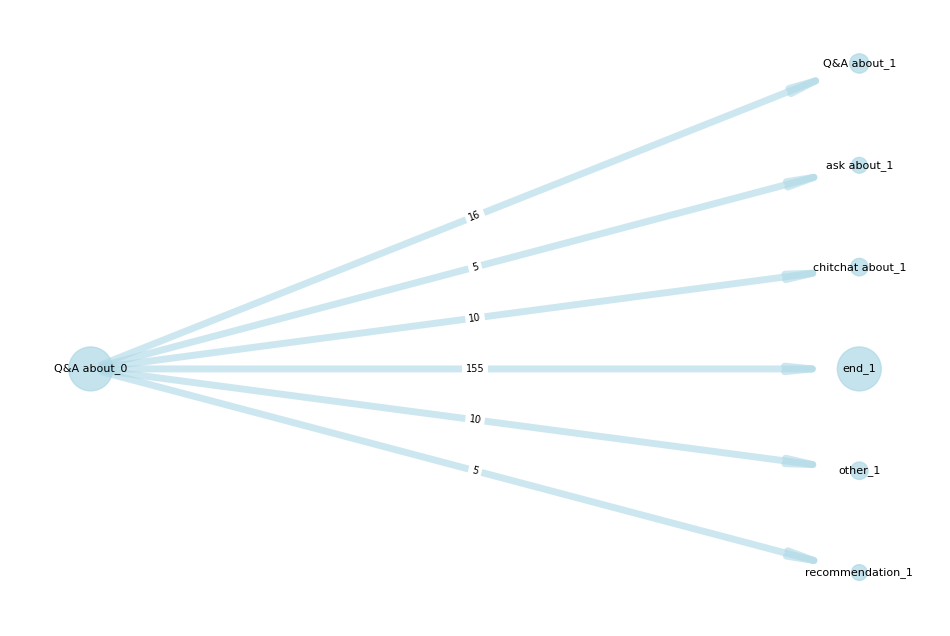

{'greeting, ask_0': 'greeting, ask_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'recommendation_1': 'recommendation_1'}


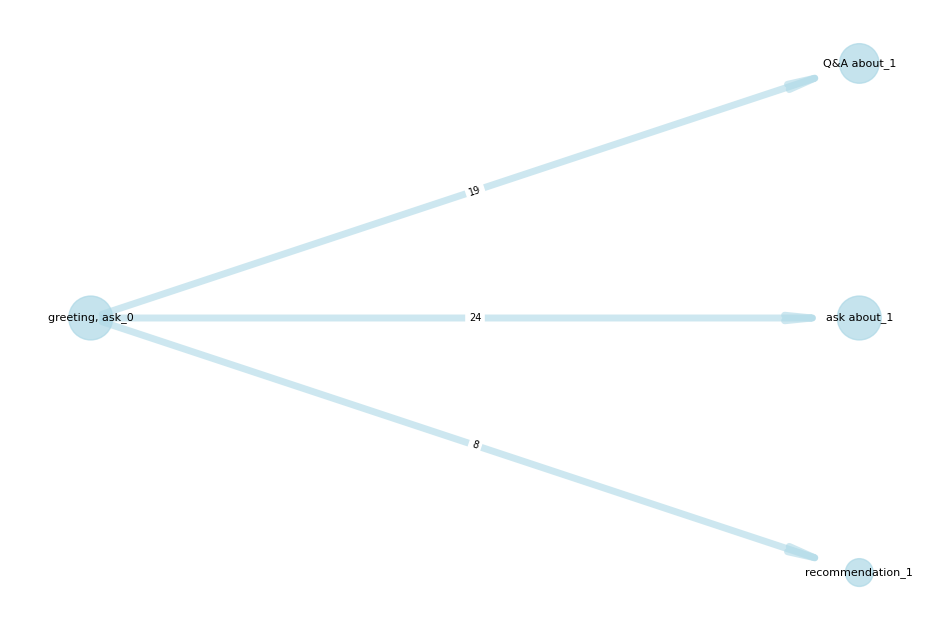

{'chitchat about_0': 'chitchat about_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'end_1': 'end_1', 'recommendation_1': 'recommendation_1', 'chitchat about_2': 'chitchat about_2'}


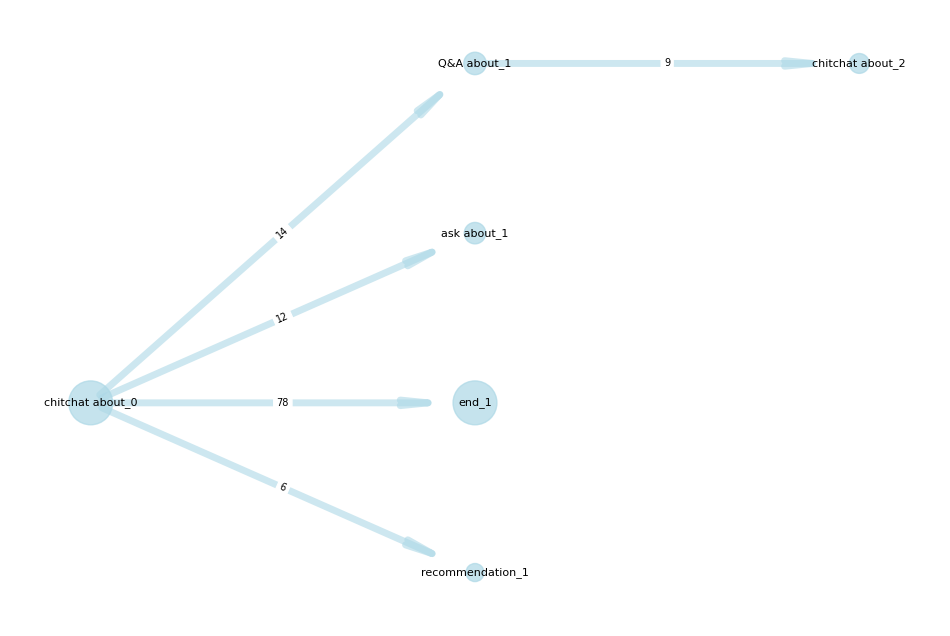

{'other_0': 'other_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'end_1': 'end_1', 'greeting_1': 'greeting_1', 'recommendation_1': 'recommendation_1', 'saying goodbye_1': 'saying goodbye_1', 'other_2': 'other_2'}


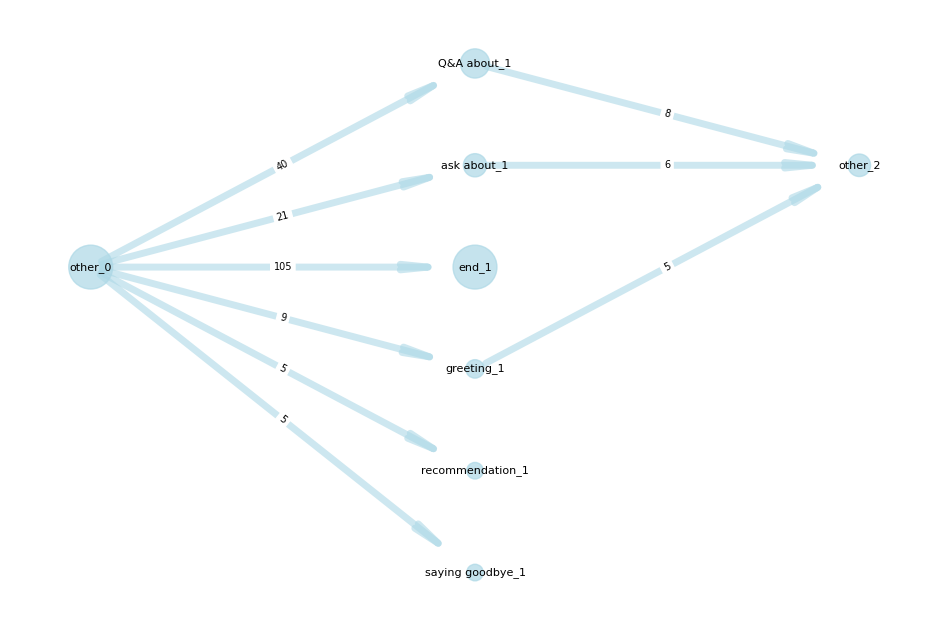

{'ask about_0': 'ask about_0', 'Q&A about_1': 'Q&A about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'recommendation_1': 'recommendation_1', 'ask about_2': 'ask about_2', 'chitchat about_2': 'chitchat about_2', 'Q&A about_3': 'Q&A about_3', 'other_3': 'other_3', 'recommendation_3': 'recommendation_3'}


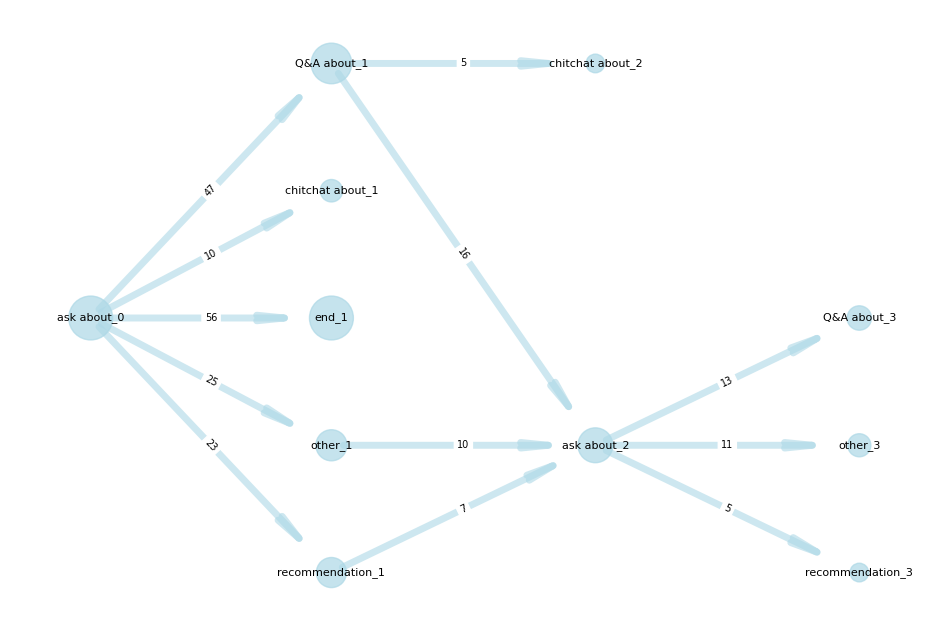

{'greeting_0': 'greeting_0', 'Q&A about_1': 'Q&A about_1', 'ask about_1': 'ask about_1', 'chitchat about_1': 'chitchat about_1', 'end_1': 'end_1', 'other_1': 'other_1', 'Q&A about_2': 'Q&A about_2', 'ask about_2': 'ask about_2', 'greeting_2': 'greeting_2', 'other_2': 'other_2', 'saying goodbye_2': 'saying goodbye_2', 'Q&A about_3': 'Q&A about_3', 'chitchat about_3': 'chitchat about_3', 'other_3': 'other_3'}


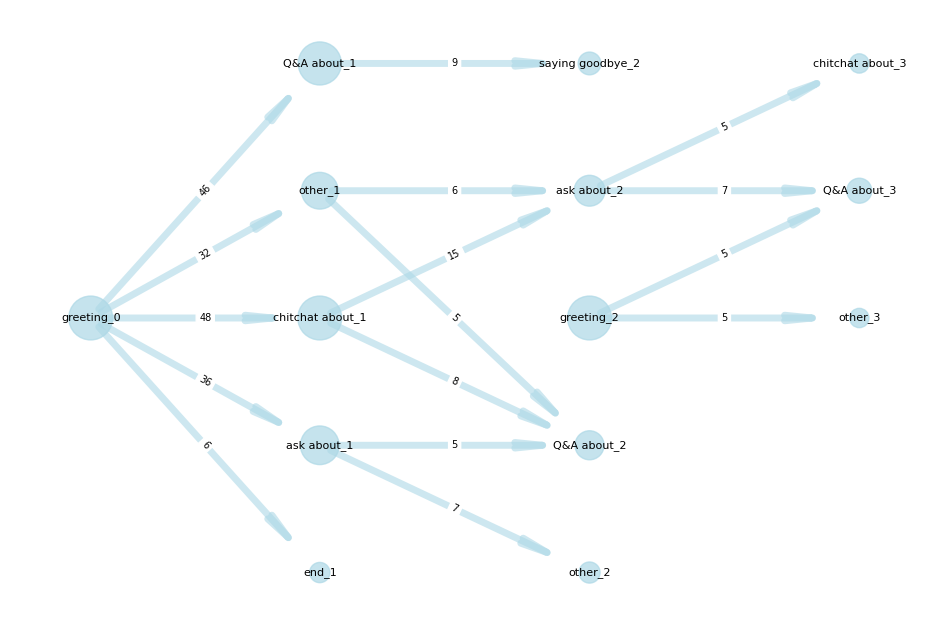

In [50]:
for dialog in dialog_dict:
    draw_graph(dialog_dict[dialog], size=(12,8))

## DuRecDial, all goals without out-of-set

{'gossip_0': 'gossip_0', '0 | ask about_1': '0 | ask about_1', 'end_1': 'end_1', '1 | gossip_2': '1 | gossip_2'}


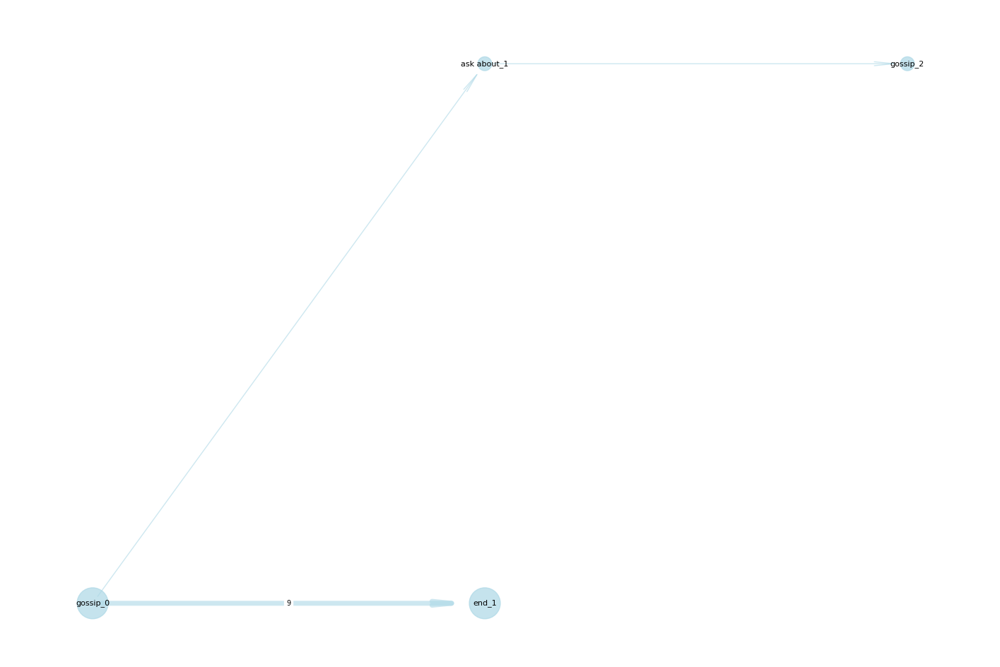

{'greeting, chitchat_0': 'greeting, chitchat_0', '3 | chitchat about_1': '3 | chitchat about_1', '3 | greeting_1': '3 | greeting_1', '4 | chitchat about_2': '4 | chitchat about_2', '6 | ask about_2': '6 | ask about_2', '6 | chitchat about_2': '6 | chitchat about_2', '10 | recommendation_3': '10 | recommendation_3', '5 | Q&A about_3': '5 | Q&A about_3', '7 | chitchat about_3': '7 | chitchat about_3', '11 | chitchat about_4': '11 | chitchat about_4', '8 | chitchat about_4': '8 | chitchat about_4', '9 | chitchat about_5': '9 | chitchat about_5'}


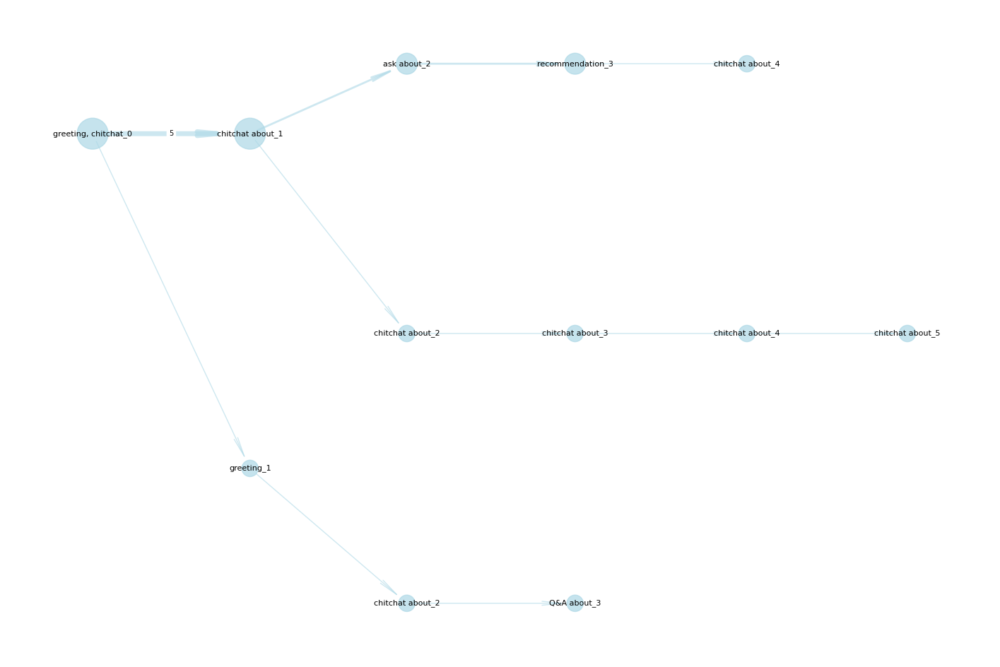

{'Q&A about_0': 'Q&A about_0', '12 | Q&A about_1': '12 | Q&A about_1', '12 | ask about_1': '12 | ask about_1', '12 | chitchat about_1': '12 | chitchat about_1', '12 | greeting_1': '12 | greeting_1', '12 | other_1': '12 | other_1', '12 | recommendation_1': '12 | recommendation_1', '12 | saying goodbye_1': '12 | saying goodbye_1', 'end_1': 'end_1', '13 | Q&A about_2': '13 | Q&A about_2', '13 | ask about_2': '13 | ask about_2', '13 | chitchat about_2': '13 | chitchat about_2', '13 | greeting_2': '13 | greeting_2', '13 | other_2': '13 | other_2', '13 | recommendation_2': '13 | recommendation_2', '16 | ask about_2': '16 | ask about_2', '16 | chitchat about_2': '16 | chitchat about_2', '16 | saying goodbye_2': '16 | saying goodbye_2', '18 | Q&A about_2': '18 | Q&A about_2', '22 | ask about_2': '22 | ask about_2', '23 | Q&A about_2': '23 | Q&A about_2', '23 | chitchat about_2': '23 | chitchat about_2', '23 | recommendation_2': '23 | recommendation_2', '14 | Q&A about_3': '14 | Q&A about_3', '

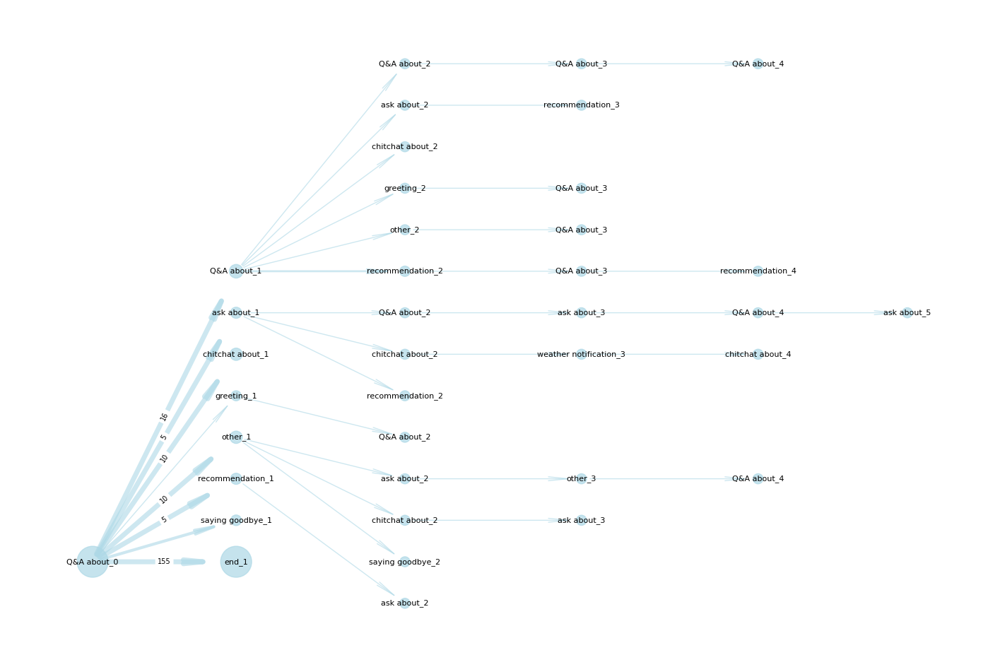

{'recommendation_0': 'recommendation_0', '33 | Q&A about_1': '33 | Q&A about_1', '33 | ask about_1': '33 | ask about_1', '33 | chat about_1': '33 | chat about_1', '33 | other_1': '33 | other_1', 'end_1': 'end_1', '34 | saying goodbye_2': '34 | saying goodbye_2', '35 | recommendation_2': '35 | recommendation_2', '36 | Q&A about_3': '36 | Q&A about_3'}


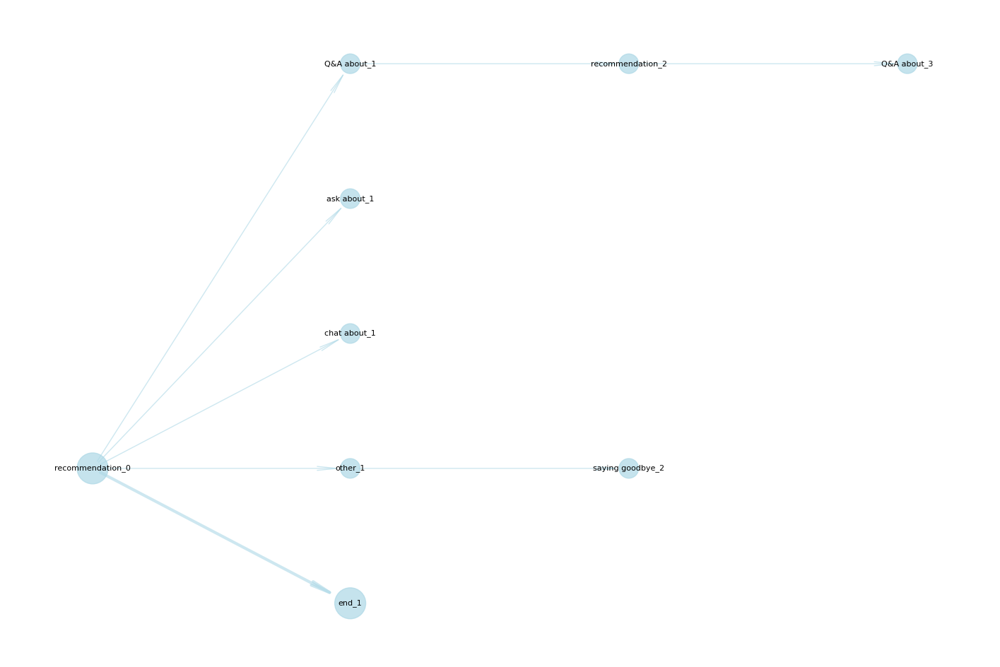

{'greeting, ask_0': 'greeting, ask_0', '37 | Q&A about_1': '37 | Q&A about_1', '37 | ask about_1': '37 | ask about_1', '37 | book return_1': '37 | book return_1', '37 | chitchat about_1': '37 | chitchat about_1', '37 | greeting_1': '37 | greeting_1', '37 | mural_1': '37 | mural_1', '37 | other_1': '37 | other_1', '37 | recommendation_1': '37 | recommendation_1', '37 | room reservation_1': '37 | room reservation_1', '37 | skate rental_1': '37 | skate rental_1', '38 | Q&A about_2': '38 | Q&A about_2', '38 | ask about_2': '38 | ask about_2', '38 | chat about_2': '38 | chat about_2', '38 | chitchat about_2': '38 | chitchat about_2', '38 | goals_2': '38 | goals_2', '38 | other_2': '38 | other_2', '38 | recommendation_2': '38 | recommendation_2', '38 | say goodbye_2': '38 | say goodbye_2', '41 | chitchat about_2': '41 | chitchat about_2', '45 | Q&A about_2': '45 | Q&A about_2', '47 | Q&A about_2': '47 | Q&A about_2', '47 | ask about_2': '47 | ask about_2', '47 | greeting_2': '47 | greeting_2

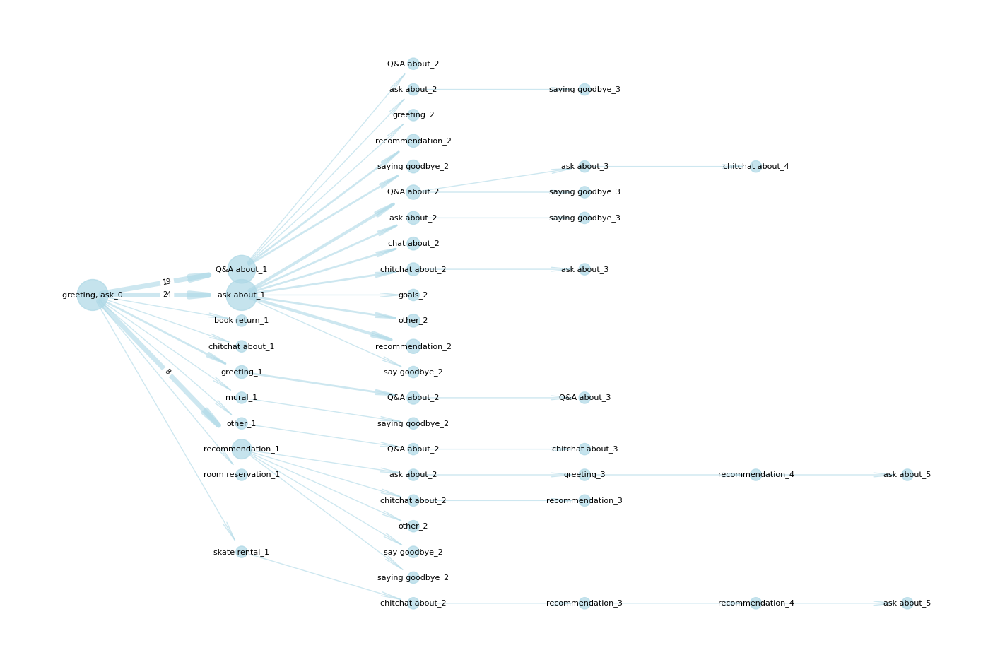

{'chitchat about_0': 'chitchat about_0', '59 | Q&A about_1': '59 | Q&A about_1', '59 | ask about_1': '59 | ask about_1', '59 | chitch_1': '59 | chitch_1', '59 | chitchat about_1': '59 | chitchat about_1', '59 | other_1': '59 | other_1', '59 | recommendation_1': '59 | recommendation_1', '59 | saying goodbye_1': '59 | saying goodbye_1', '59 | weather notification_1': '59 | weather notification_1', 'end_1': 'end_1', '60 | chitchat about_2': '60 | chitchat about_2', '60 | recommendation_2': '60 | recommendation_2', '61 | chitchat about_2': '61 | chitchat about_2', '62 | Q&A about_2': '62 | Q&A about_2', '62 | chitchat about_2': '62 | chitchat about_2', '72 | chitchat about_2': '72 | chitchat about_2', '63 | chitchat about_3': '63 | chitchat about_3', '65 | ask about_3': '65 | ask about_3', '68 | recommendation_3': '68 | recommendation_3', '71 | chitchat about_3': '71 | chitchat about_3', '73 | ask about_3': '73 | ask about_3', '64 | recommendation_4': '64 | recommendation_4', '66 | Q&A abo

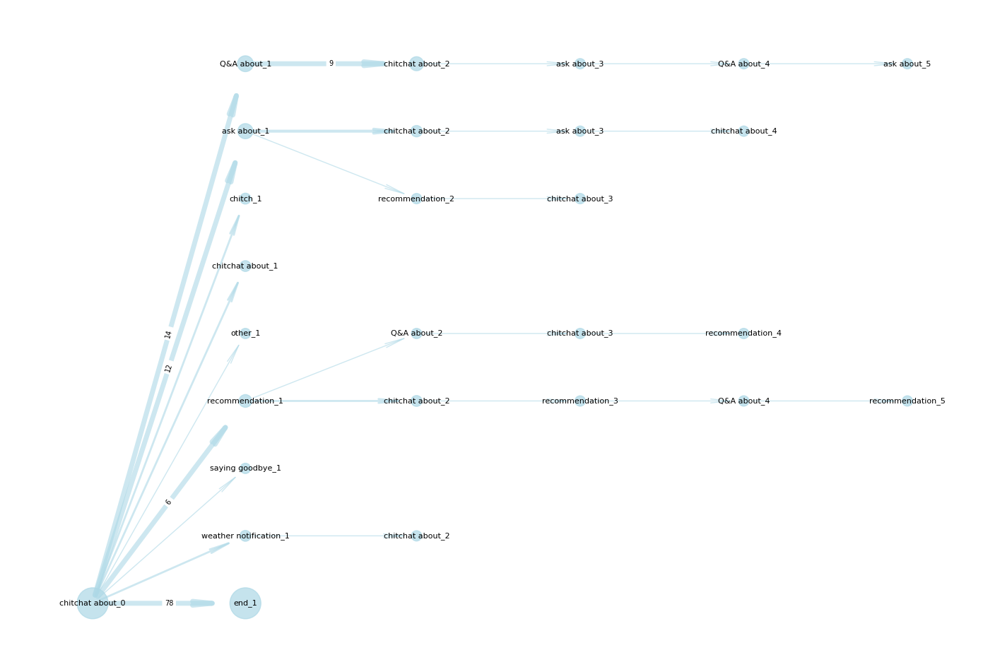

{'chat about_0': 'chat about_0', '76 | Q&A about_1': '76 | Q&A about_1', '76 | ask about_1': '76 | ask about_1', '76 | chitchat about_1': '76 | chitchat about_1', '76 | recommendation_1': '76 | recommendation_1', 'end_1': 'end_1', '77 | chat about_2': '77 | chat about_2', '79 | recommendation_2': '79 | recommendation_2', '78 | chat about_3': '78 | chat about_3', '80 | chat about_3': '80 | chat about_3', '81 | recommendation_4': '81 | recommendation_4', '82 | chat about_5': '82 | chat about_5'}


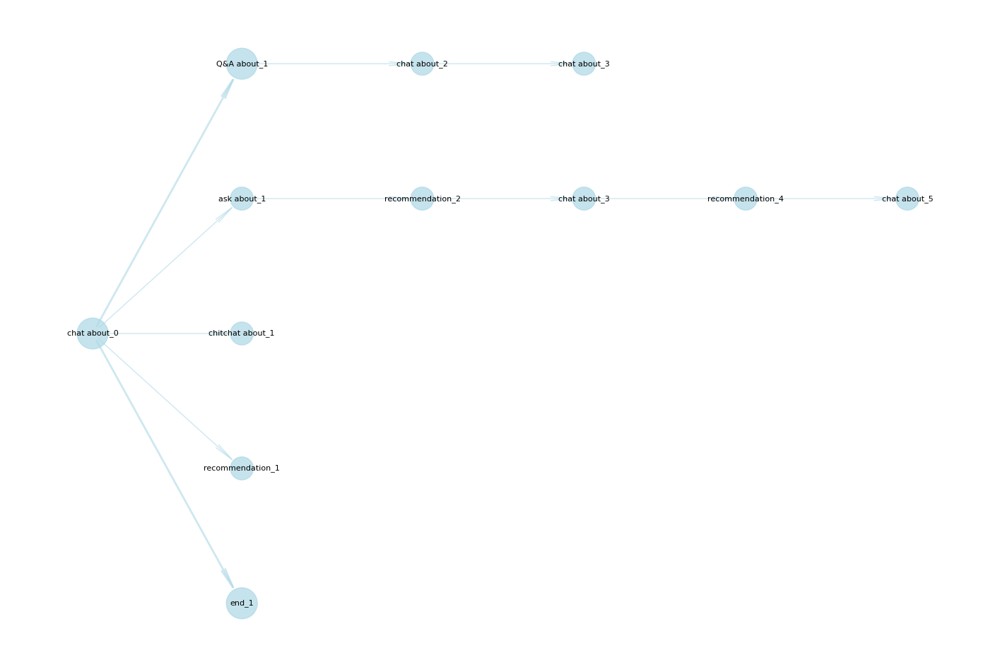

{'greeting, other_0': 'greeting, other_0', '83 | ask about_1': '83 | ask about_1', '83 | chitchat about_1': '83 | chitchat about_1', '83 | greeting_1': '83 | greeting_1', '83 | other_1': '83 | other_1', '84 | saying goodbye,_2': '84 | saying goodbye,_2', '85 | ask about_2': '85 | ask about_2', '86 | greeting, other_2': '86 | greeting, other_2', '87 | ask about_3': '87 | ask about_3'}


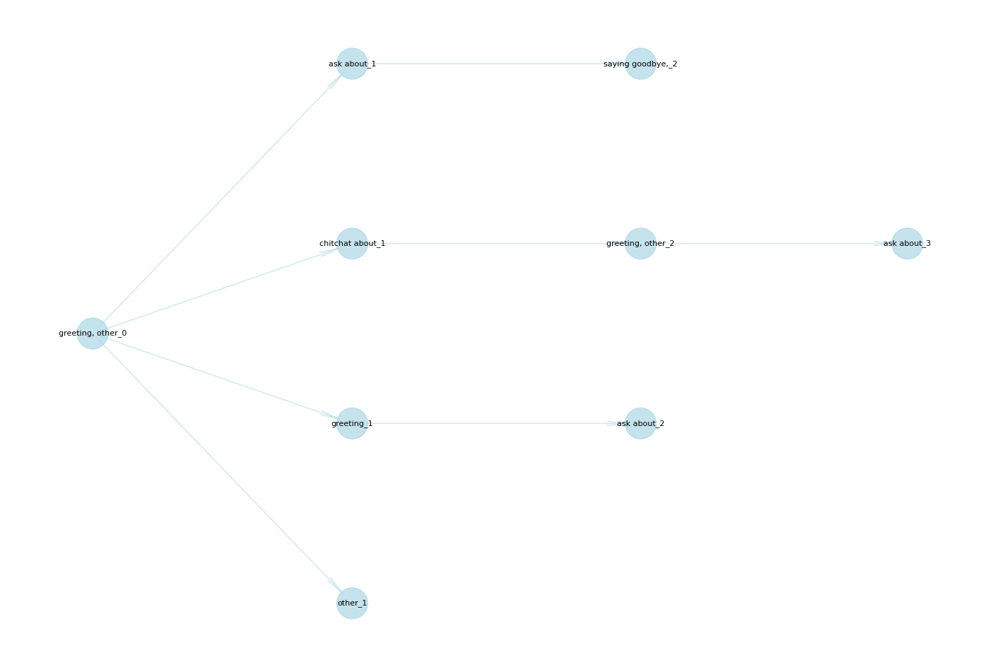

{'greeting, weather_0': 'greeting, weather_0', '89 | weather notification_1': '89 | weather notification_1', '90 | Q&A about_2': '90 | Q&A about_2'}


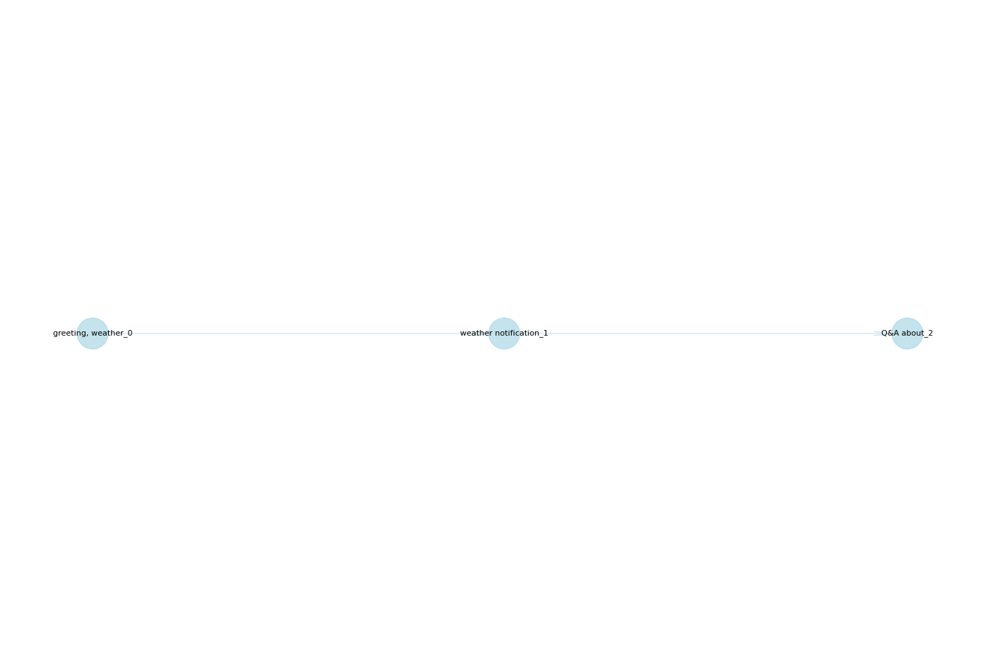

{'other_0': 'other_0', '91 | Q&A about_1': '91 | Q&A about_1', '91 | ask about_1': '91 | ask about_1', '91 | chitchat about_1': '91 | chitchat about_1', '91 | goals_1': '91 | goals_1', '91 | goodbye_1': '91 | goodbye_1', '91 | greeting, ask_1': '91 | greeting, ask_1', '91 | greeting_1': '91 | greeting_1', '91 | recommendation_1': '91 | recommendation_1', '91 | saying goodbye_1': '91 | saying goodbye_1', '91 | travel_1': '91 | travel_1', 'end_1': 'end_1', '100 | ask about_2': '100 | ask about_2', '100 | chat about_2': '100 | chat about_2', '100 | chitchat about_2': '100 | chitchat about_2', '100 | other_2': '100 | other_2', '100 | recommendation_2': '100 | recommendation_2', '110 | other_2': '110 | other_2', '111 | other_2': '111 | other_2', '114 | reservation_2': '114 | reservation_2', '92 | Q&A about_2': '92 | Q&A about_2', '92 | ask about_2': '92 | ask about_2', '92 | chitchat about_2': '92 | chitchat about_2', '92 | greeting_2': '92 | greeting_2', '92 | other_2': '92 | other_2', '92

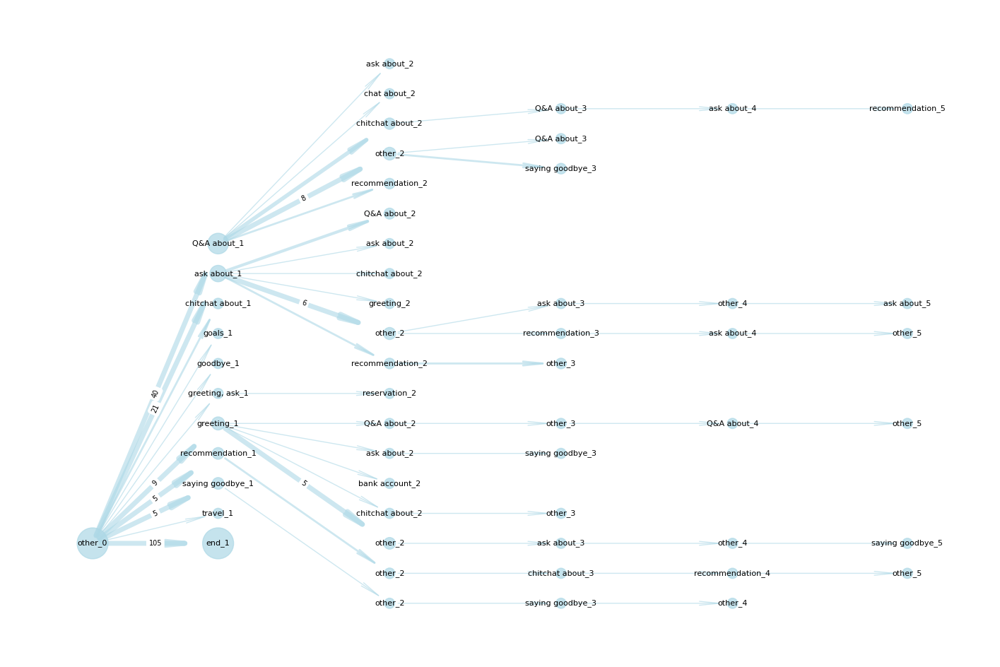

{'saying goodbye_0': 'saying goodbye_0', '121 | Q&A about_1': '121 | Q&A about_1', '121 | ask about_1': '121 | ask about_1', '121 | chitchat about_1': '121 | chitchat about_1', '121 | weather notification_1': '121 | weather notification_1', 'end_1': 'end_1', '122 | Q&A about_2': '122 | Q&A about_2', '123 | saying goodbye_2': '123 | saying goodbye_2', '124 | saying goodbye_2': '124 | saying goodbye_2'}


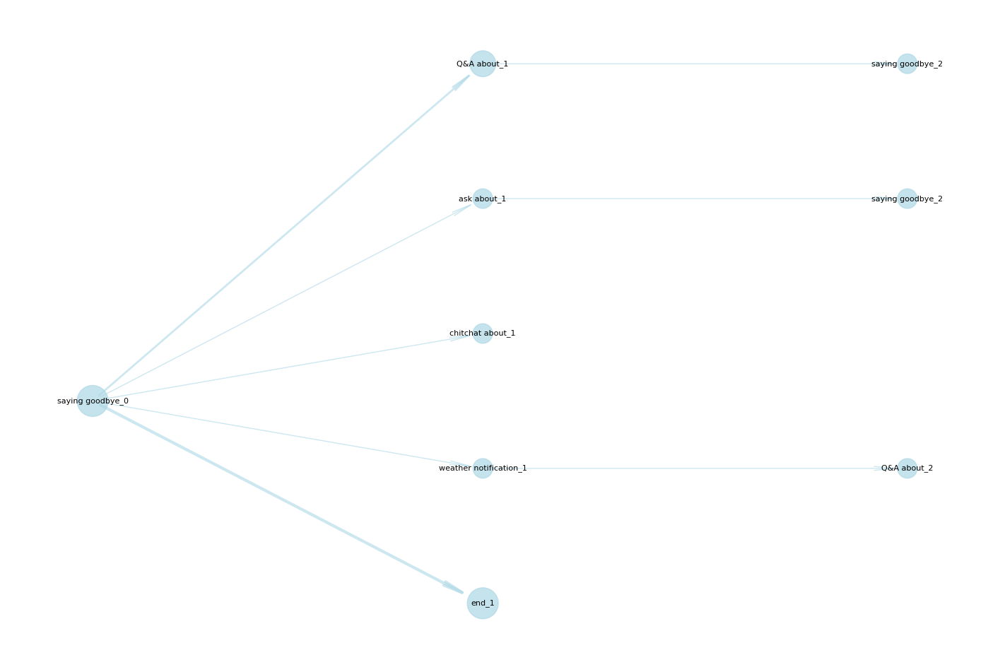

{'ask about_0': 'ask about_0', '125 | Q&A about_1': '125 | Q&A about_1', '125 | ask about_1': '125 | ask about_1', '125 | chat about_1': '125 | chat about_1', '125 | chitchat about_1': '125 | chitchat about_1', '125 | gossip_1': '125 | gossip_1', '125 | greeting_1': '125 | greeting_1', '125 | hair cut_1': '125 | hair cut_1', '125 | job interview_1': '125 | job interview_1', '125 | order food_1': '125 | order food_1', '125 | other_1': '125 | other_1', '125 | recommendation_1': '125 | recommendation_1', '125 | say goodbye_1': '125 | say goodbye_1', '125 | saying goodbye_1': '125 | saying goodbye_1', '125 | travel_1': '125 | travel_1', '125 | weather notification_1': '125 | weather notification_1', 'end_1': 'end_1', '126 | Q&A about_2': '126 | Q&A about_2', '126 | ask about_2': '126 | ask about_2', '126 | chitchat about_2': '126 | chitchat about_2', '126 | other_2': '126 | other_2', '126 | saying goodbye_2': '126 | saying goodbye_2', '130 | Q&A about_2': '130 | Q&A about_2', '130 | ask ab

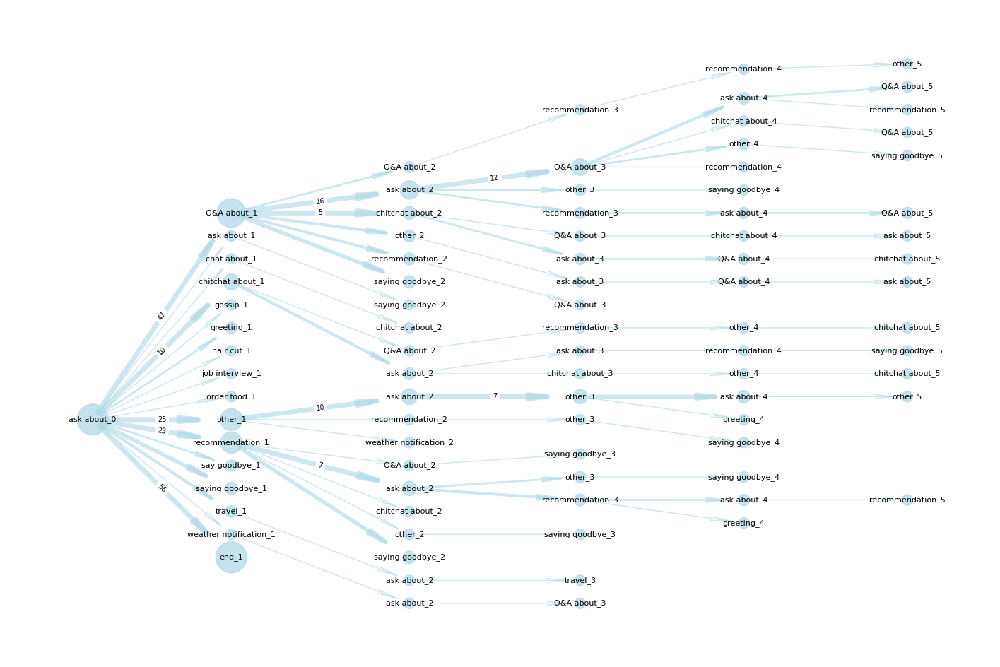

{'weather notification_0': 'weather notification_0', '175 | Q&A about_1': '175 | Q&A about_1', '175 | ask about_1': '175 | ask about_1', '175 | chat about_1': '175 | chat about_1', 'end_1': 'end_1', '176 | chat about_2': '176 | chat about_2', '179 | ask about_2': '179 | ask about_2', '177 | ask about_3': '177 | ask about_3', '180 | chat about_3': '180 | chat about_3', '178 | chat about_4': '178 | chat about_4'}


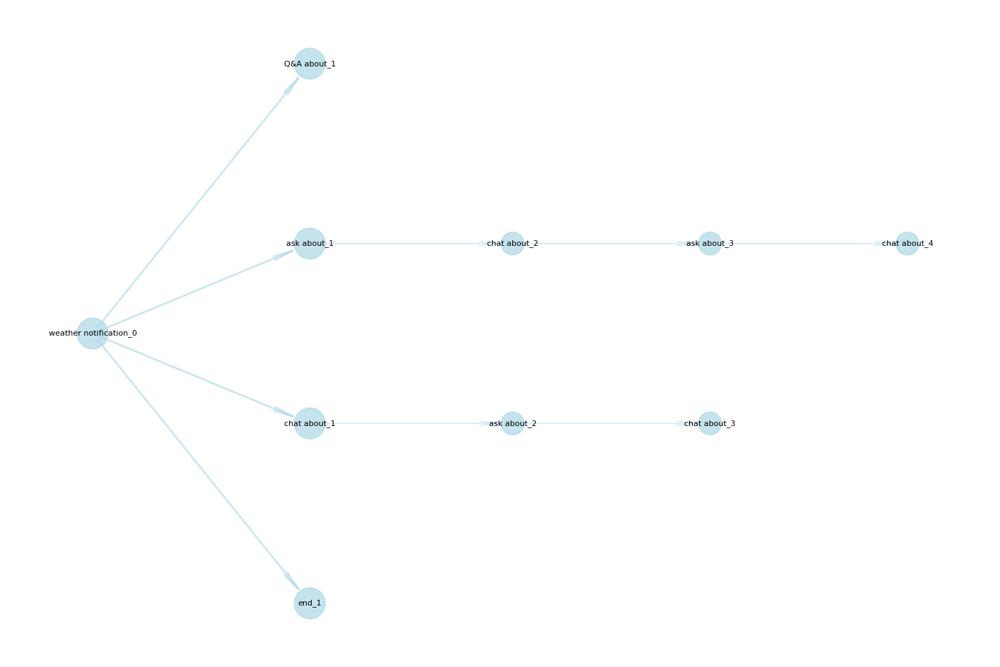

{'greeting_0': 'greeting_0', '181 | Q&A about_1': '181 | Q&A about_1', '181 | ask about_1': '181 | ask about_1', '181 | booking a_1': '181 | booking a_1', '181 | chitchat about_1': '181 | chitchat about_1', '181 | greeting, ask_1': '181 | greeting, ask_1', '181 | greeting, chitchat_1': '181 | greeting, chitchat_1', '181 | other_1': '181 | other_1', '181 | recommendation_1': '181 | recommendation_1', '181 | saying goodbye_1': '181 | saying goodbye_1', 'end_1': 'end_1', '181 | ask about_2': '181 | ask about_2', '182 | Q&A about_2': '182 | Q&A about_2', '182 | ask about_2': '182 | ask about_2', '182 | greeting_2': '182 | greeting_2', '182 | other_2': '182 | other_2', '182 | recommendation_2': '182 | recommendation_2', '182 | saying goodbye_2': '182 | saying goodbye_2', '186 | Q&A about_2': '186 | Q&A about_2', '186 | ask about_2': '186 | ask about_2', '186 | chitchat about_2': '186 | chitchat about_2', '186 | greeting_2': '186 | greeting_2', '186 | recommendation_2': '186 | recommendation

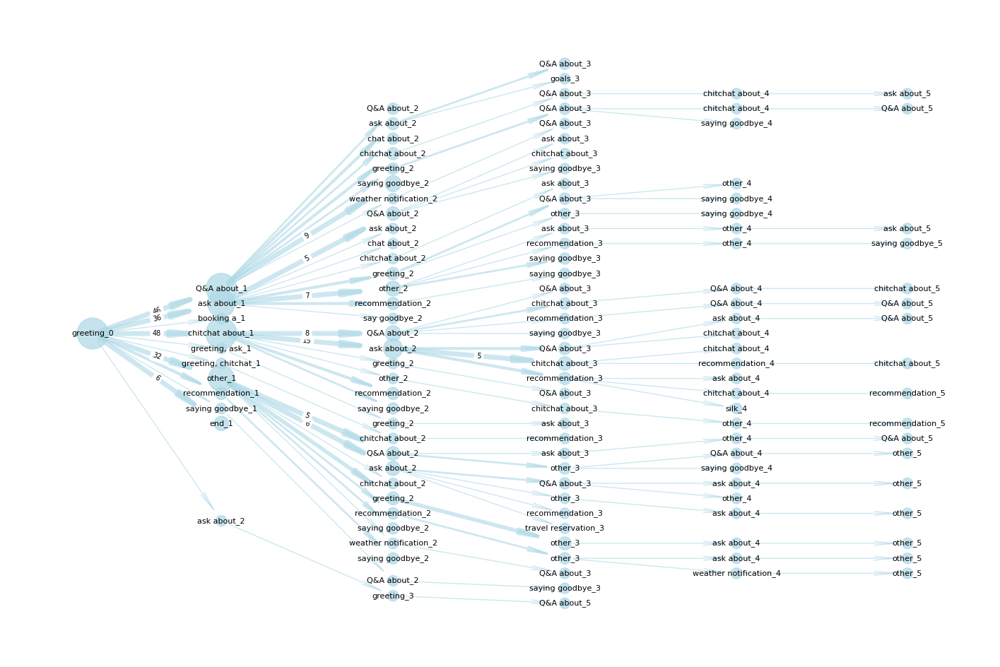

In [18]:
for dialog in dialog_dict_full:
    draw_graph(dialog_dict_full[dialog])

## Open goals, most common (edge weight > 5 + most common 20 & others grouped as 'rare goal')

In [51]:
most_often = [('wants', 1974),
 ('explains', 778),
 ('expresses', 426),
 ('gives', 400),
 ('confirms', 322),
 ('provides', 298),
 ('agrees', 211),
 ('informs', 202),
 ('asks', 196),
 ('mentions', 175),
 ('offers', 131),
 ('states', 103),
 ('shares', 91),
 ('suggests', 86),
 ('expressing', 83),
 ('shows', 71),
 ('acknowledges', 66),
 ('asking', 55),
 ('requests', 55),
 ('clarifies', 53)]
most_often = [x[0] for x in most_often]

In [52]:
data = pd.read_csv('open_fin.tsv', sep='\t')
d_as_goals = [x.split(': ')[1] for x in set(data['id_and_goal'])]
number = re.compile(r'\[\d+\]')
lists_goals = [re.split(number, x) for x in d_as_goals]
lists_goals = [prep_goals([x.strip() for x in y if x]) for y in lists_goals]
list_first_goals = set(x[0] for x in lists_goals)
lists_goals = [[goal for goal in dialog if int(goal.split('_')[1]) < 11 and 'nan' not in goal] for dialog in lists_goals]
lists_only_durec_goals = [[goal if any(item in goal for item in most_often) else 'rare goal_' + goal.split('_')[1] for goal in dialog] for dialog in lists_goals]
dialog_dict = make_dialog_dict(lists_only_durec_goals, list_first_goals)
dialog_dict_full = make_dialog_dict(lists_only_durec_goals, list_first_goals, small_nodes=True)

{'wants_0': 'wants_0', 'agrees_1': 'agrees_1', 'asks_1': 'asks_1', 'confirms_1': 'confirms_1', 'explains_1': 'explains_1', 'expresses_1': 'expresses_1', 'gives_1': 'gives_1', 'informs_1': 'informs_1', 'mentions_1': 'mentions_1', 'offers_1': 'offers_1', 'provides_1': 'provides_1', 'rare goal_1': 'rare goal_1', 'shares_1': 'shares_1', 'shows_1': 'shows_1', 'states_1': 'states_1', 'agrees_2': 'agrees_2', 'confirms_2': 'confirms_2', 'explains_2': 'explains_2', 'expresses_2': 'expresses_2', 'gives_2': 'gives_2', 'informs_2': 'informs_2', 'provides_2': 'provides_2', 'rare goal_2': 'rare goal_2', 'wants_2': 'wants_2', 'agrees_3': 'agrees_3', 'confirms_3': 'confirms_3', 'explains_3': 'explains_3', 'expresses_3': 'expresses_3', 'gives_3': 'gives_3', 'informs_3': 'informs_3', 'provides_3': 'provides_3', 'rare goal_3': 'rare goal_3', 'wants_3': 'wants_3', 'agrees_5': 'agrees_5', 'confirms_5': 'confirms_5', 'explains_5': 'explains_5', 'expresses_5': 'expresses_5', 'gives_5': 'gives_5', 'informs_5'

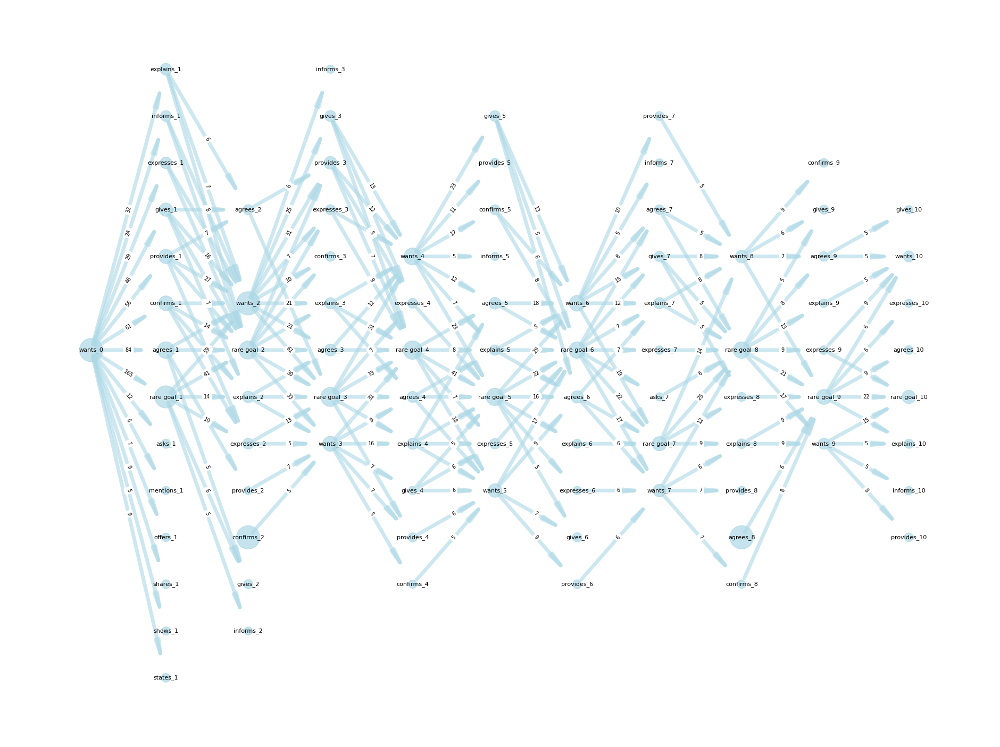

{'expresses_0': 'expresses_0', 'agrees_1': 'agrees_1', 'offers_1': 'offers_1', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'rare goal_2': 'rare goal_2'}


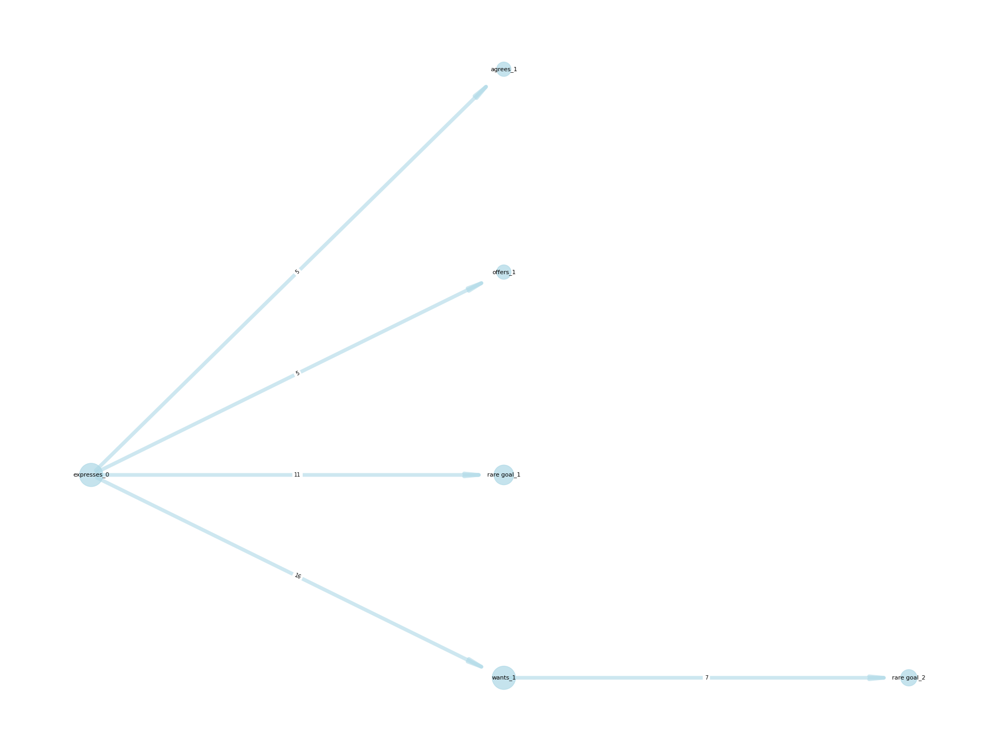

In [53]:
for dialog in dialog_dict:
    draw_graph(dialog_dict[dialog], size=(24,18))

## Open goals, all (most common 20 + others grouped as 'rare goal')

{'greeting/wants_0': 'greeting/wants_0', 'rare goal_1': 'rare goal_1', 'mentions_2': 'mentions_2', 'wants_3': 'wants_3', 'explains_4': 'explains_4', 'wants_5': 'wants_5', 'agrees_6': 'agrees_6', 'mentions_7': 'mentions_7', 'agrees_8': 'agrees_8', 'shares_9': 'shares_9', 'provides_10': 'provides_10'}


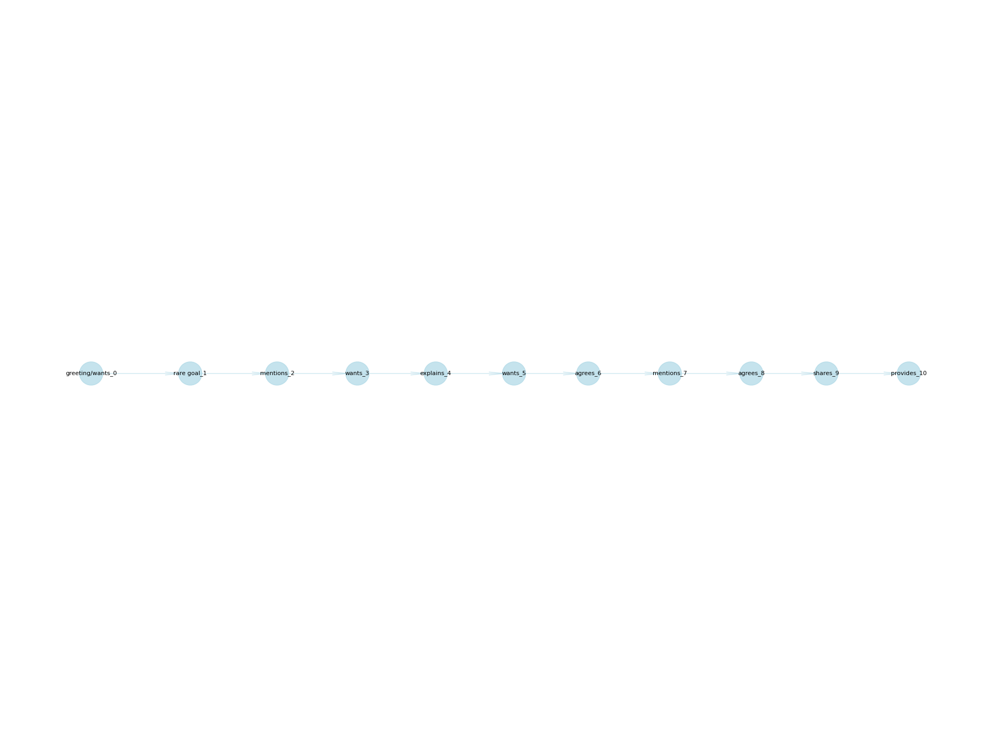

{'wants_0': 'wants_0', 'acknowledges_1': 'acknowledges_1', 'agrees_1': 'agrees_1', 'asking_1': 'asking_1', 'asks_1': 'asks_1', 'clarifies_1': 'clarifies_1', 'confirms_1': 'confirms_1', 'disagrees_1': 'disagrees_1', 'end_1': 'end_1', 'explains_1': 'explains_1', 'expresses_1': 'expresses_1', 'expressing_1': 'expressing_1', 'gives_1': 'gives_1', 'informs_1': 'informs_1', 'mentions_1': 'mentions_1', 'offers_1': 'offers_1', 'provides_1': 'provides_1', 'rare goal_1': 'rare goal_1', 'requests_1': 'requests_1', 'shares_1': 'shares_1', 'shows_1': 'shows_1', 'states_1': 'states_1', 'suggests_1': 'suggests_1', 'acknowledges_2': 'acknowledges_2', 'agrees_2': 'agrees_2', 'asking_2': 'asking_2', 'asks_2': 'asks_2', 'clarifies_2': 'clarifies_2', 'confirms_2': 'confirms_2', 'disagrees_2': 'disagrees_2', 'explains_2': 'explains_2', 'expresses_2': 'expresses_2', 'expressing_2': 'expressing_2', 'gives_2': 'gives_2', 'informs_2': 'informs_2', 'mentions_2': 'mentions_2', 'offers_2': 'offers_2', 'provides_2

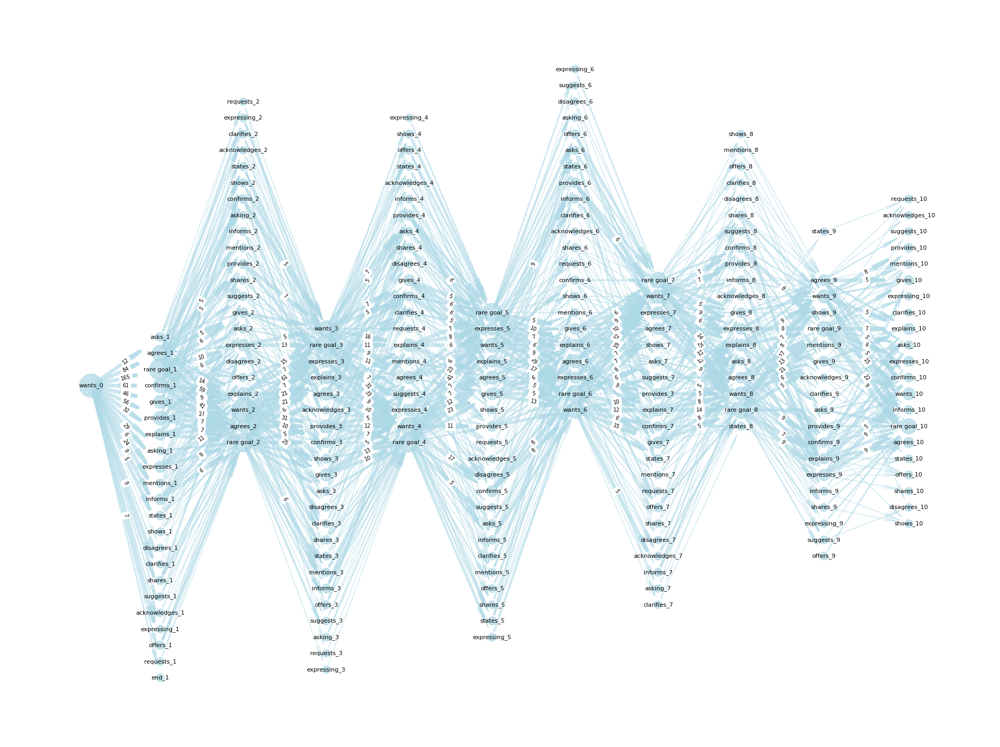

{'requests_0': 'requests_0', 'agrees_1': 'agrees_1', 'asks_1': 'asks_1', 'requests_2': 'requests_2', 'agrees_3': 'agrees_3', 'requests_4': 'requests_4', 'rare goal_5': 'rare goal_5', 'provides_6': 'provides_6', 'informs_7': 'informs_7', 'expresses_8': 'expresses_8'}


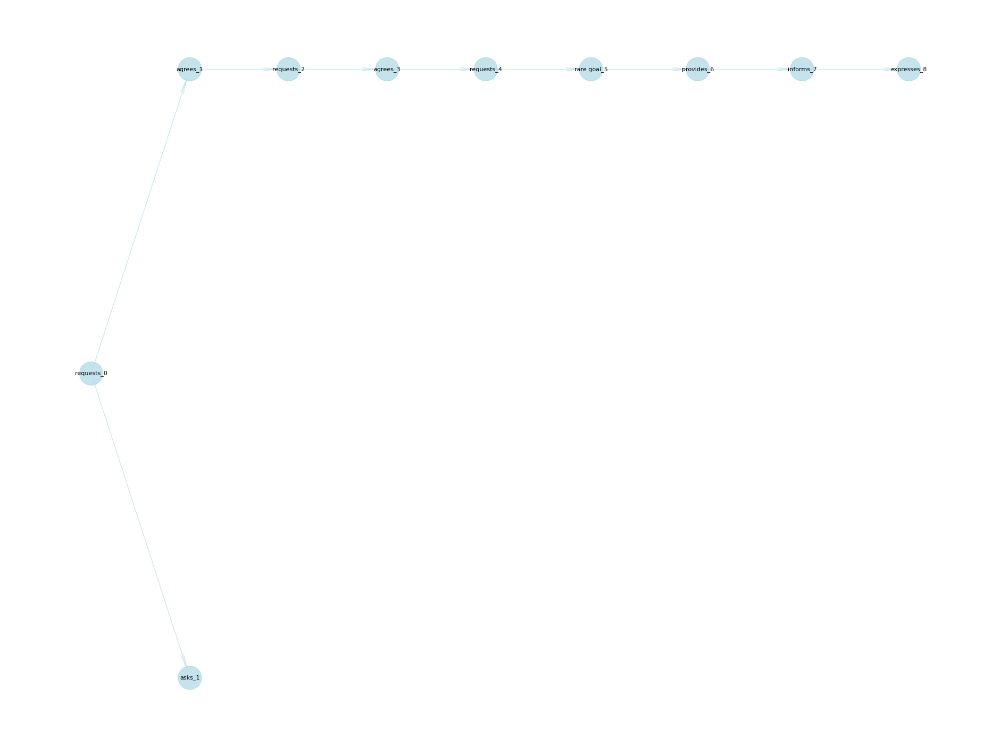

{'confirms_0': 'confirms_0', 'wants_1': 'wants_1', 'explains_2': 'explains_2', 'rare goal_3': 'rare goal_3', 'gives_4': 'gives_4'}


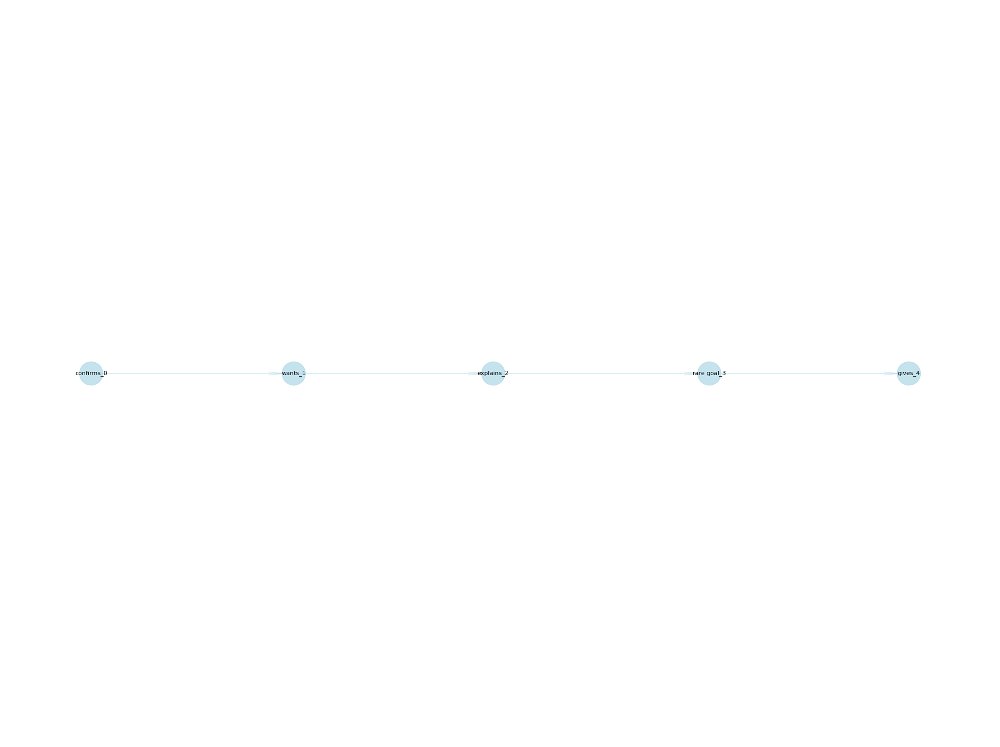

{'expressing_0': 'expressing_0', 'agrees_1': 'agrees_1', 'asking_1': 'asking_1', 'gives_1': 'gives_1', 'rare goal_1': 'rare goal_1', 'states_1': 'states_1', 'wants_1': 'wants_1', 'expressing_2': 'expressing_2', 'rare goal_2': 'rare goal_2', 'wants_2': 'wants_2', 'asking_3': 'asking_3', 'provides_3': 'provides_3', 'rare goal_3': 'rare goal_3', 'states_3': 'states_3', 'wants_3': 'wants_3', 'expresses_4': 'expresses_4', 'expressing_4': 'expressing_4', 'rare goal_4': 'rare goal_4', 'wants_4': 'wants_4', 'expressing_5': 'expressing_5', 'rare goal_5': 'rare goal_5', 'states_5': 'states_5', 'asking_6': 'asking_6', 'expressing_6': 'expressing_6', 'wants_6': 'wants_6', 'explains_7': 'explains_7', 'offers_7': 'offers_7', 'rare goal_7': 'rare goal_7', 'agrees_8': 'agrees_8', 'expressing_8': 'expressing_8', 'gives_8': 'gives_8', 'expressing_9': 'expressing_9', 'rare goal_9': 'rare goal_9', 'expressing_10': 'expressing_10'}


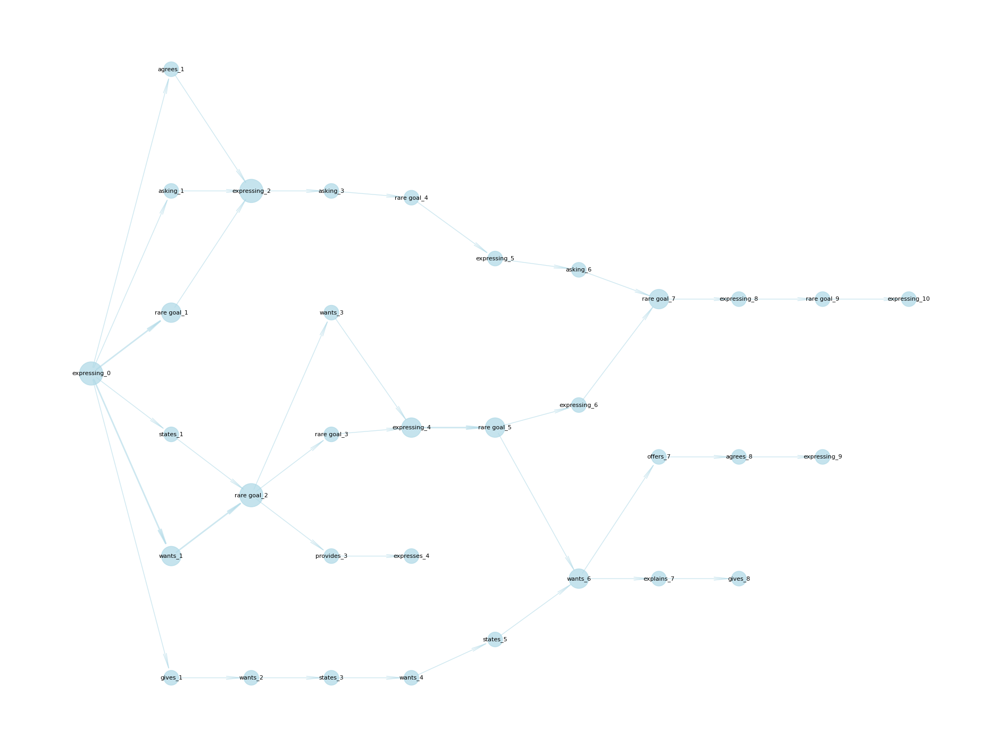

{'mentions_0': 'mentions_0', 'explains_1': 'explains_1', 'expresses_1': 'expresses_1', 'gives_1': 'gives_1', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'agrees_2': 'agrees_2', 'expresses_2': 'expresses_2', 'gives_2': 'gives_2', 'provides_2': 'provides_2', 'rare goal_2': 'rare goal_2', 'wants_2': 'wants_2', 'agrees_3': 'agrees_3', 'asks_3': 'asks_3', 'explains_3': 'explains_3', 'mentions_3': 'mentions_3', 'rare goal_3': 'rare goal_3', 'states_3': 'states_3', 'agrees_4': 'agrees_4', 'confirms_4': 'confirms_4', 'expresses_4': 'expresses_4', 'provides_4': 'provides_4', 'rare goal_4': 'rare goal_4', 'suggests_4': 'suggests_4', 'wants_4': 'wants_4', 'agrees_5': 'agrees_5', 'asks_5': 'asks_5', 'clarifies_5': 'clarifies_5', 'expresses_5': 'expresses_5', 'rare goal_5': 'rare goal_5', 'expresses_6': 'expresses_6', 'rare goal_6': 'rare goal_6', 'requests_6': 'requests_6', 'wants_6': 'wants_6', 'agrees_7': 'agrees_7', 'rare goal_7': 'rare goal_7', 'suggests_7': 'suggests_7', 'explains_8':

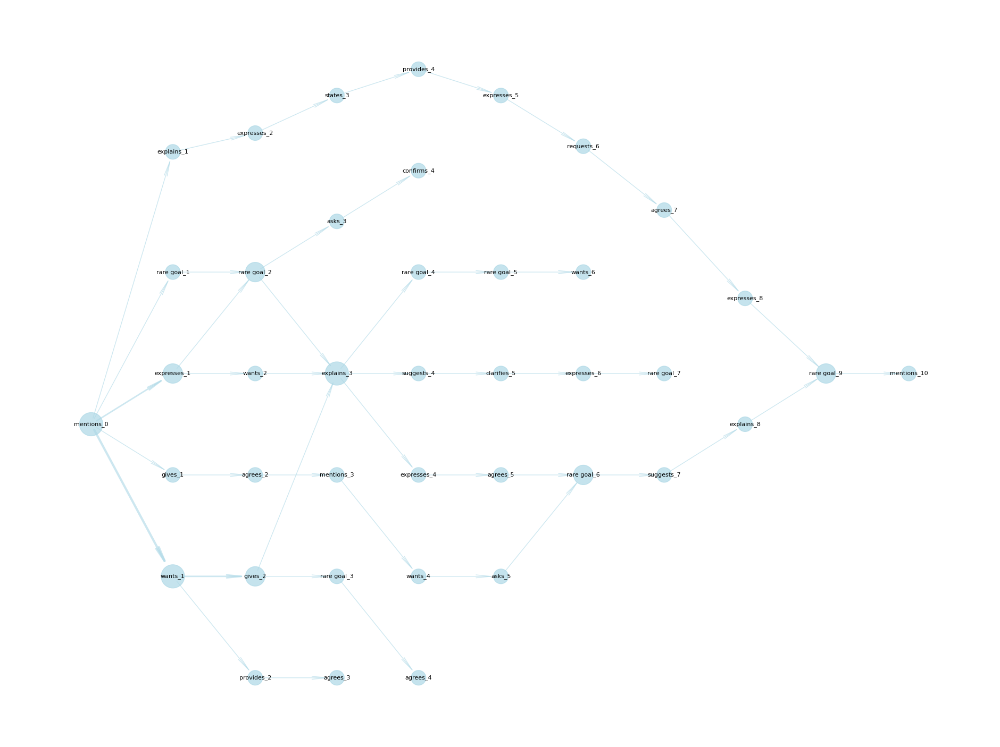

{'acknowledges_0': 'acknowledges_0', 'rare goal_1': 'rare goal_1', 'expresses_2': 'expresses_2', 'rare goal_3': 'rare goal_3', 'agrees_4': 'agrees_4', 'rare goal_5': 'rare goal_5'}


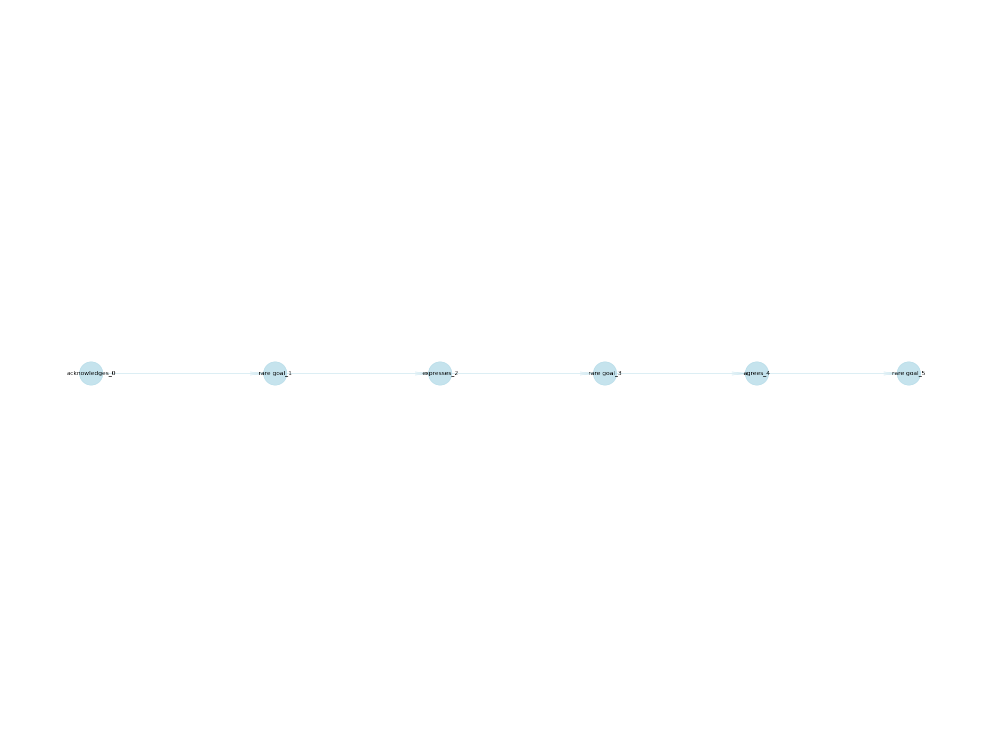

{'provides_0': 'provides_0', 'agrees_1': 'agrees_1', 'expresses_1': 'expresses_1', 'wants_1': 'wants_1', 'confirms_2': 'confirms_2', 'explains_2': 'explains_2', 'expresses_2': 'expresses_2', 'offers_2': 'offers_2', 'provides_2': 'provides_2', 'agrees_3': 'agrees_3', 'clarifies_3': 'clarifies_3', 'expresses_3': 'expresses_3', 'provides_3': 'provides_3', 'rare goal_3': 'rare goal_3', 'wants_3': 'wants_3', 'confirms_4': 'confirms_4', 'expresses_4': 'expresses_4', 'rare goal_4': 'rare goal_4', 'wants_4': 'wants_4', 'agrees_5': 'agrees_5', 'explains_5': 'explains_5', 'provides_5': 'provides_5', 'rare goal_5': 'rare goal_5', 'provides_6': 'provides_6', 'rare goal_6': 'rare goal_6', 'wants_6': 'wants_6', 'confirms_7': 'confirms_7', 'rare goal_7': 'rare goal_7', 'expresses_8': 'expresses_8', 'provides_8': 'provides_8', 'rare goal_9': 'rare goal_9', 'rare goal_10': 'rare goal_10'}


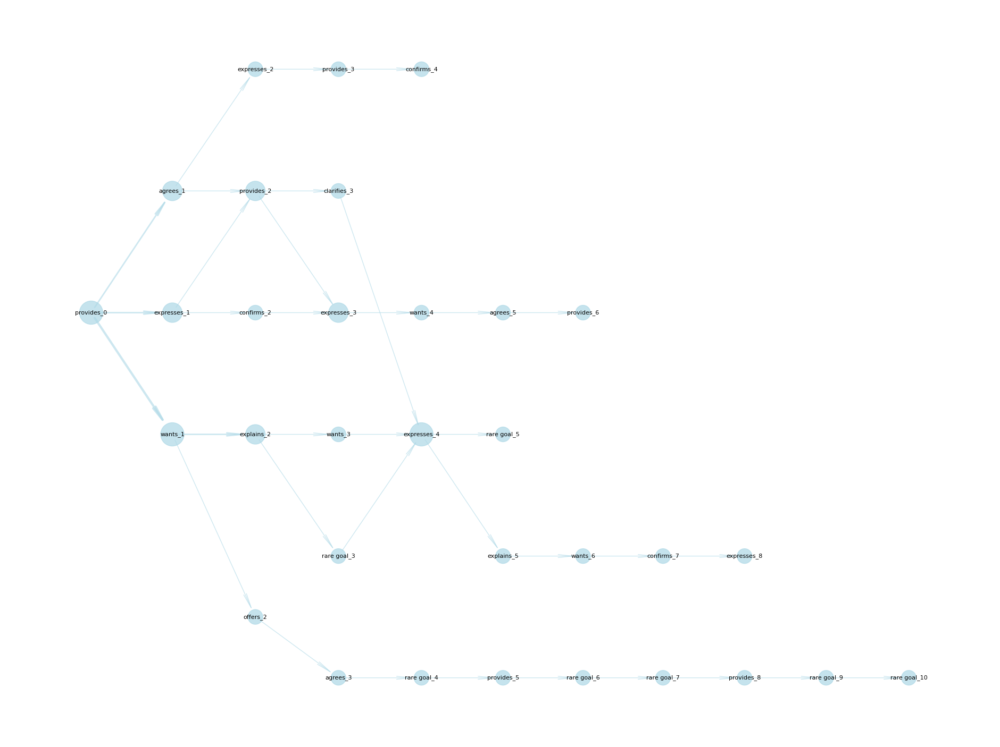

{'informs_0': 'informs_0', 'agrees_1': 'agrees_1', 'expresses_1': 'expresses_1', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'agrees_2': 'agrees_2', 'confirms_2': 'confirms_2', 'expresses_2': 'expresses_2', 'rare goal_2': 'rare goal_2', 'mentions_3': 'mentions_3', 'rare goal_3': 'rare goal_3', 'suggests_3': 'suggests_3', 'wants_3': 'wants_3', 'agrees_4': 'agrees_4', 'asks_4': 'asks_4', 'mentions_4': 'mentions_4', 'rare goal_4': 'rare goal_4', 'explains_5': 'explains_5', 'gives_5': 'gives_5', 'mentions_5': 'mentions_5', 'provides_5': 'provides_5', 'rare goal_5': 'rare goal_5', 'rare goal_6': 'rare goal_6', 'confirms_7': 'confirms_7', 'provides_7': 'provides_7', 'suggests_7': 'suggests_7', 'provides_8': 'provides_8', 'rare goal_8': 'rare goal_8', 'shows_8': 'shows_8', 'asks_9': 'asks_9', 'informs_9': 'informs_9', 'rare goal_9': 'rare goal_9', 'expresses_10': 'expresses_10', 'provides_10': 'provides_10', 'rare goal_10': 'rare goal_10'}


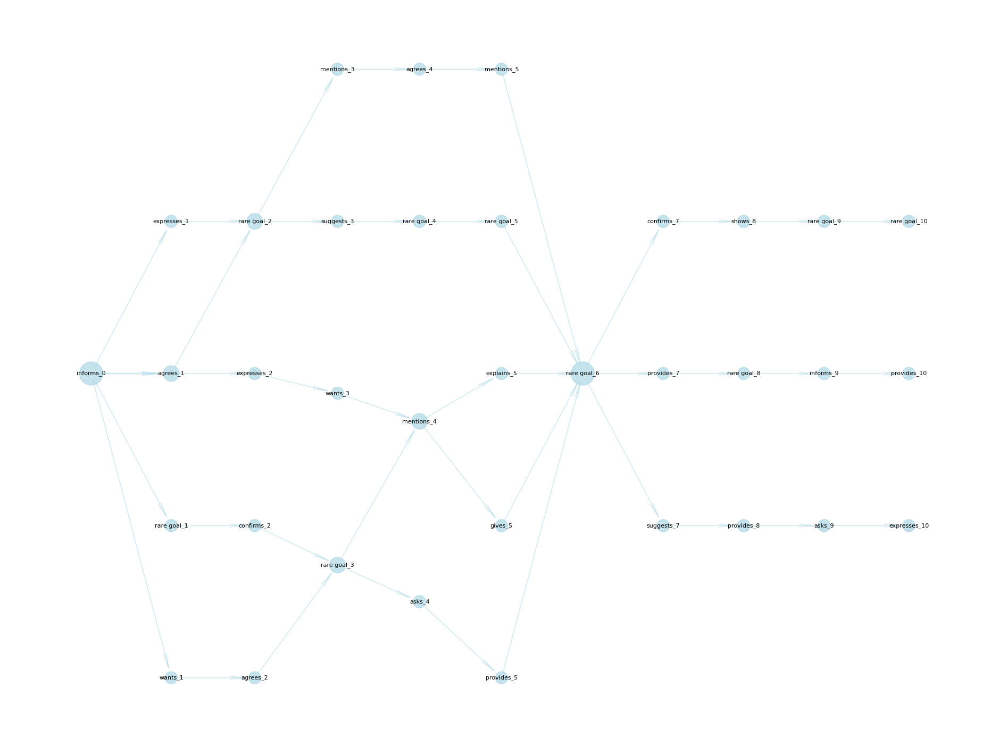

{'asking_0': 'asking_0', 'expressing_1': 'expressing_1', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'gives_2': 'gives_2', 'rare goal_2': 'rare goal_2', 'expressing_3': 'expressing_3', 'rare goal_3': 'rare goal_3', 'wants_3': 'wants_3', 'asking_4': 'asking_4', 'rare goal_4': 'rare goal_4', 'explains_5': 'explains_5', 'rare goal_5': 'rare goal_5', 'expressing_6': 'expressing_6', 'rare goal_6': 'rare goal_6', 'expresses_7': 'expresses_7', 'rare goal_7': 'rare goal_7', 'asking_8': 'asking_8', 'expressing_8': 'expressing_8', 'rare goal_8': 'rare goal_8', 'rare goal_9': 'rare goal_9', 'asking_10': 'asking_10'}


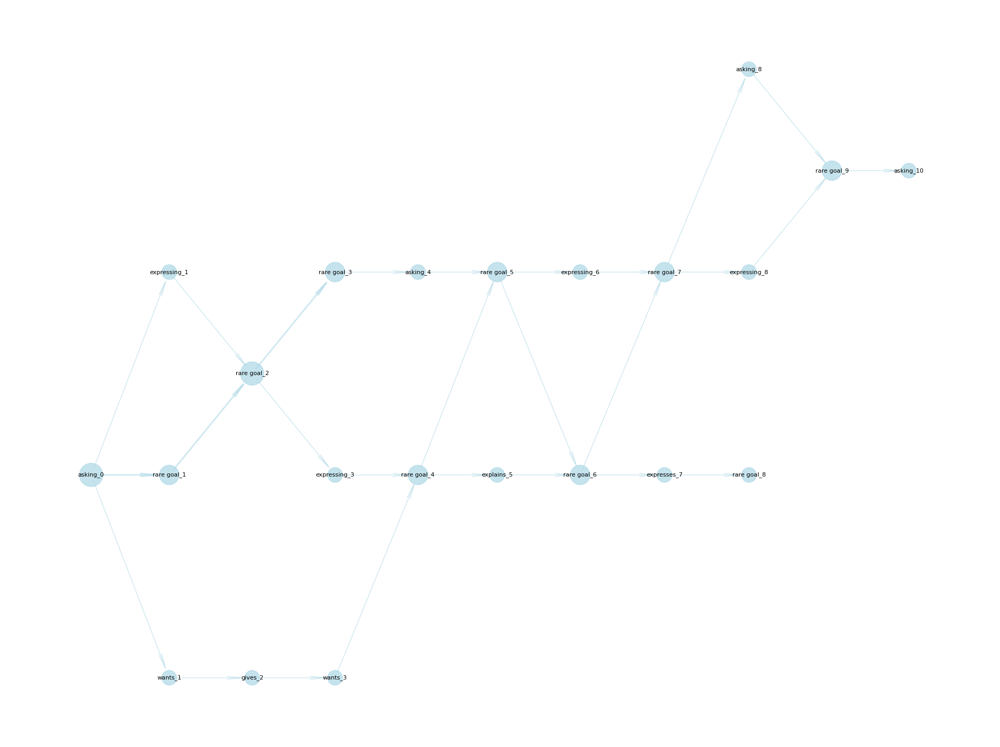

{'offers_0': 'offers_0', 'agrees_1': 'agrees_1', 'confirms_1': 'confirms_1', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'confirms_2': 'confirms_2', 'informs_2': 'informs_2', 'rare goal_2': 'rare goal_2', 'requests_2': 'requests_2', 'wants_2': 'wants_2', 'mentions_3': 'mentions_3', 'provides_3': 'provides_3', 'rare goal_3': 'rare goal_3', 'states_3': 'states_3', 'wants_3': 'wants_3', 'informs_4': 'informs_4', 'offers_4': 'offers_4', 'provides_4': 'provides_4', 'rare goal_4': 'rare goal_4', 'requests_4': 'requests_4', 'wants_4': 'wants_4', 'agrees_5': 'agrees_5', 'rare goal_5': 'rare goal_5', 'agrees_6': 'agrees_6', 'rare goal_6': 'rare goal_6', 'requests_6': 'requests_6', 'asks_7': 'asks_7', 'gives_7': 'gives_7', 'mentions_7': 'mentions_7', 'offers_7': 'offers_7', 'rare goal_7': 'rare goal_7', 'agrees_8': 'agrees_8', 'explains_8': 'explains_8', 'informs_8': 'informs_8', 'rare goal_8': 'rare goal_8', 'wants_8': 'wants_8', 'expresses_9': 'expresses_9', 'mentions_9': 'mentions_9',

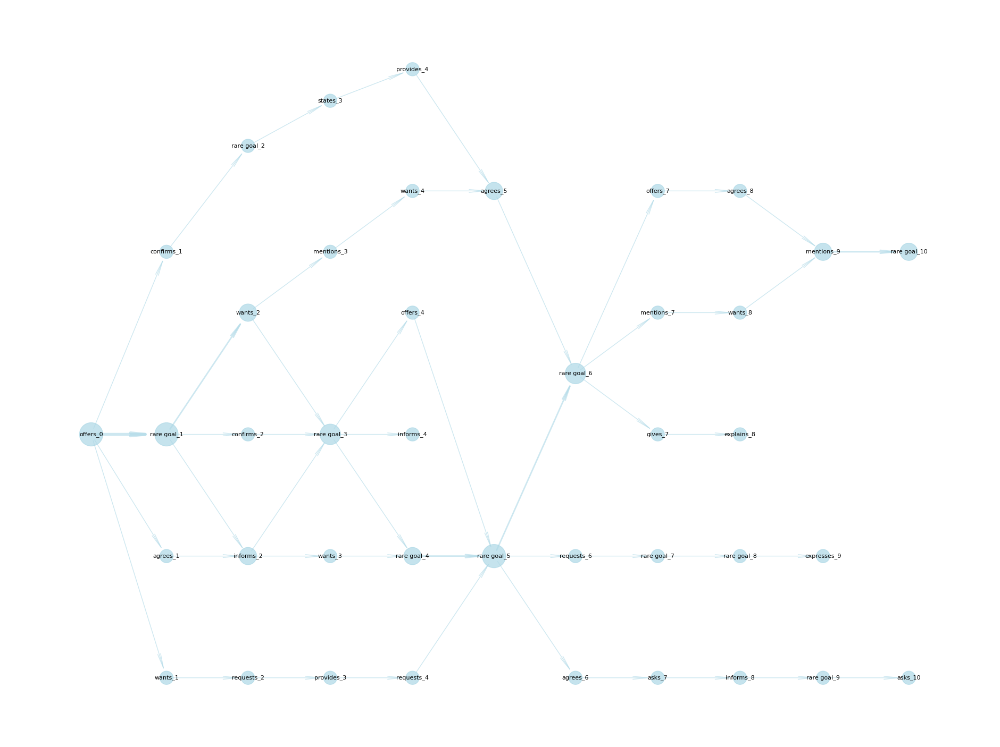

{'agrees_0': 'agrees_0', 'rare goal_1': 'rare goal_1', 'wants_1': 'wants_1', 'confirms_2': 'confirms_2', 'offers_2': 'offers_2', 'rare goal_3': 'rare goal_3', 'suggests_3': 'suggests_3', 'agrees_4': 'agrees_4', 'rare goal_4': 'rare goal_4', 'rare goal_5': 'rare goal_5', 'wants_5': 'wants_5', 'asking_6': 'asking_6', 'gives_6': 'gives_6', 'rare goal_7': 'rare goal_7'}


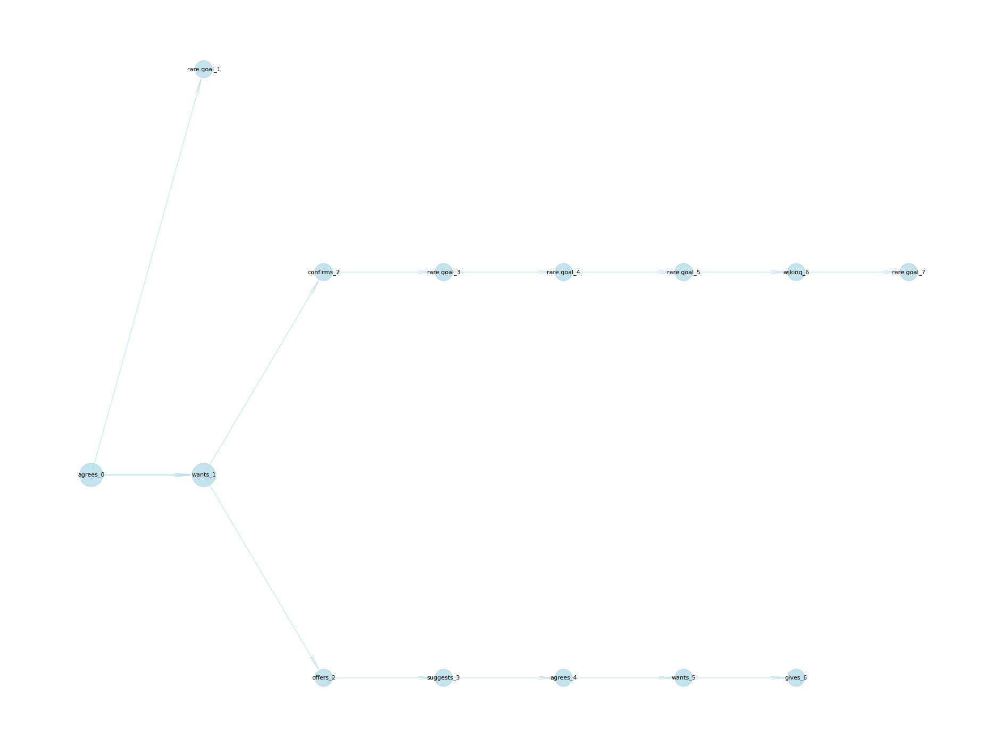

{'asks_0': 'asks_0', 'confirms_1': 'confirms_1', 'gives_1': 'gives_1', 'wants_1': 'wants_1', 'clarifies_2': 'clarifies_2', 'explains_2': 'explains_2', 'rare goal_2': 'rare goal_2', 'wants_2': 'wants_2', 'confirms_3': 'confirms_3', 'expresses_3': 'expresses_3', 'gives_3': 'gives_3', 'provides_3': 'provides_3', 'agrees_4': 'agrees_4', 'confirms_4': 'confirms_4', 'informs_4': 'informs_4', 'rare goal_4': 'rare goal_4', 'asks_5': 'asks_5', 'expresses_5': 'expresses_5', 'requests_5': 'requests_5', 'suggests_5': 'suggests_5', 'agrees_6': 'agrees_6', 'informs_6': 'informs_6', 'rare goal_6': 'rare goal_6', 'requests_7': 'requests_7', 'wants_7': 'wants_7', 'gives_8': 'gives_8'}


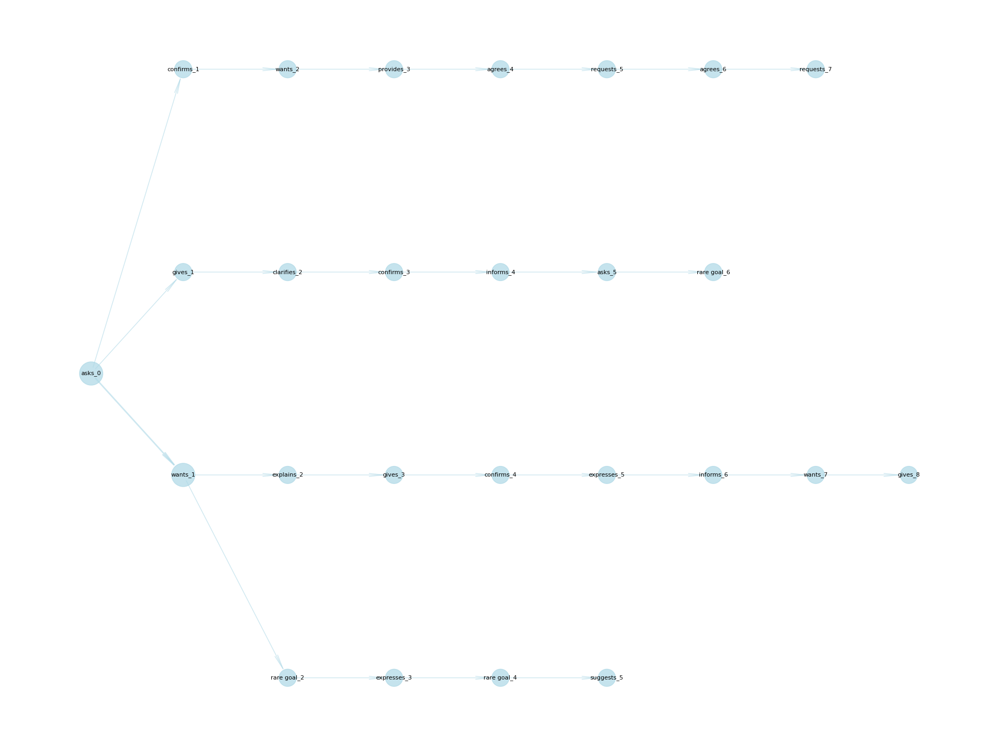

{'shares_0': 'shares_0', 'agrees_1': 'agrees_1', 'expresses_1': 'expresses_1', 'provides_2': 'provides_2', 'shares_2': 'shares_2', 'wants_2': 'wants_2', 'asks_3': 'asks_3', 'explains_3': 'explains_3', 'expresses_4': 'expresses_4', 'rare goal_4': 'rare goal_4', 'asks_5': 'asks_5', 'shares_5': 'shares_5', 'asks_6': 'asks_6', 'offers_6': 'offers_6', 'gives_7': 'gives_7', 'rare goal_7': 'rare goal_7', 'explains_8': 'explains_8', 'rare goal_8': 'rare goal_8', 'agrees_9': 'agrees_9', 'rare goal_9': 'rare goal_9', 'expresses_10': 'expresses_10'}


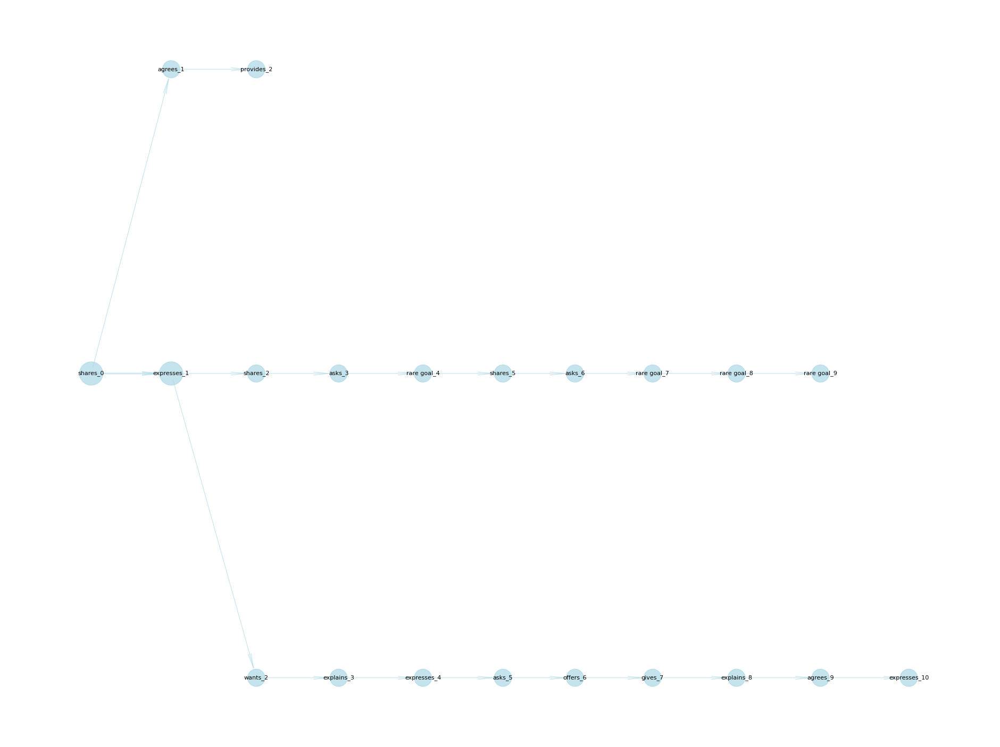

{'states_0': 'states_0', 'agrees_1': 'agrees_1', 'asks_1': 'asks_1', 'clarifies_1': 'clarifies_1', 'explains_1': 'explains_1', 'offers_1': 'offers_1', 'explains_2': 'explains_2', 'rare goal_2': 'rare goal_2', 'states_2': 'states_2', 'wants_2': 'wants_2', 'agrees_3': 'agrees_3', 'asks_3': 'asks_3', 'expresses_3': 'expresses_3', 'rare goal_3': 'rare goal_3', 'confirms_4': 'confirms_4', 'expresses_4': 'expresses_4', 'rare goal_4': 'rare goal_4', 'states_4': 'states_4', 'rare goal_5': 'rare goal_5', 'expresses_6': 'expresses_6', 'rare goal_7': 'rare goal_7', 'rare goal_8': 'rare goal_8'}


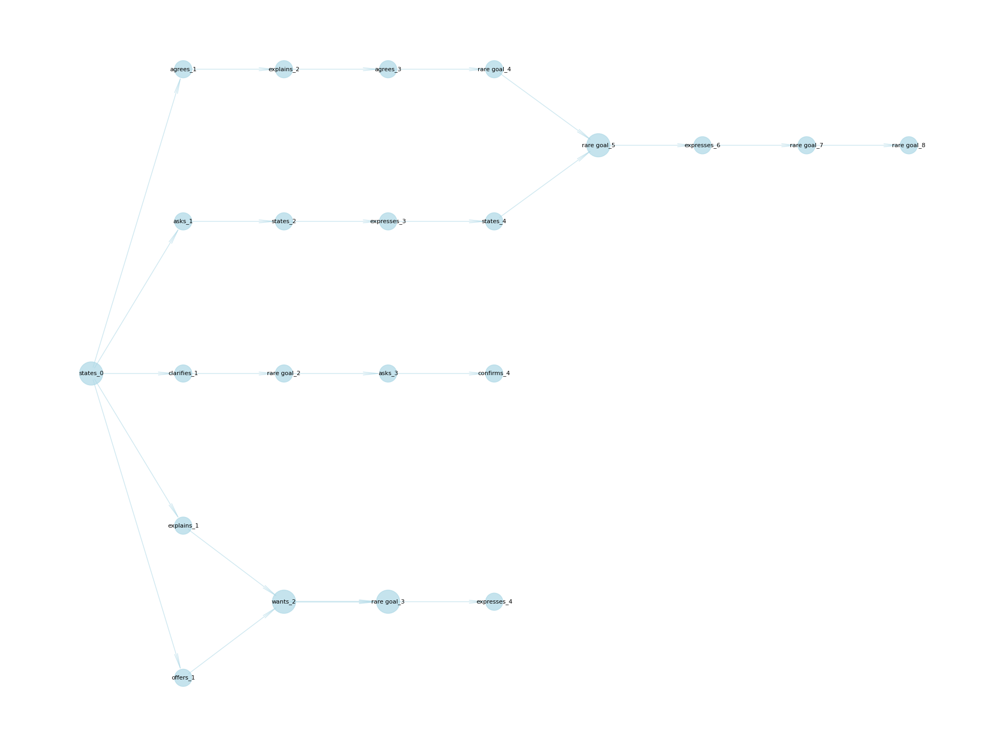

{'shows_0': 'shows_0', 'expresses_1': 'expresses_1', 'rare goal_1': 'rare goal_1', 'agrees_2': 'agrees_2', 'shows_2': 'shows_2', 'wants_2': 'wants_2', 'explains_3': 'explains_3', 'expresses_3': 'expresses_3', 'gives_3': 'gives_3', 'agrees_4': 'agrees_4', 'asks_4': 'asks_4', 'explains_5': 'explains_5', 'rare goal_5': 'rare goal_5', 'wants_5': 'wants_5', 'provides_6': 'provides_6', 'shows_6': 'shows_6', 'rare goal_7': 'rare goal_7', 'gives_8': 'gives_8', 'rare goal_8': 'rare goal_8', 'shows_8': 'shows_8', 'explains_9': 'explains_9', 'rare goal_9': 'rare goal_9', 'rare goal_10': 'rare goal_10'}


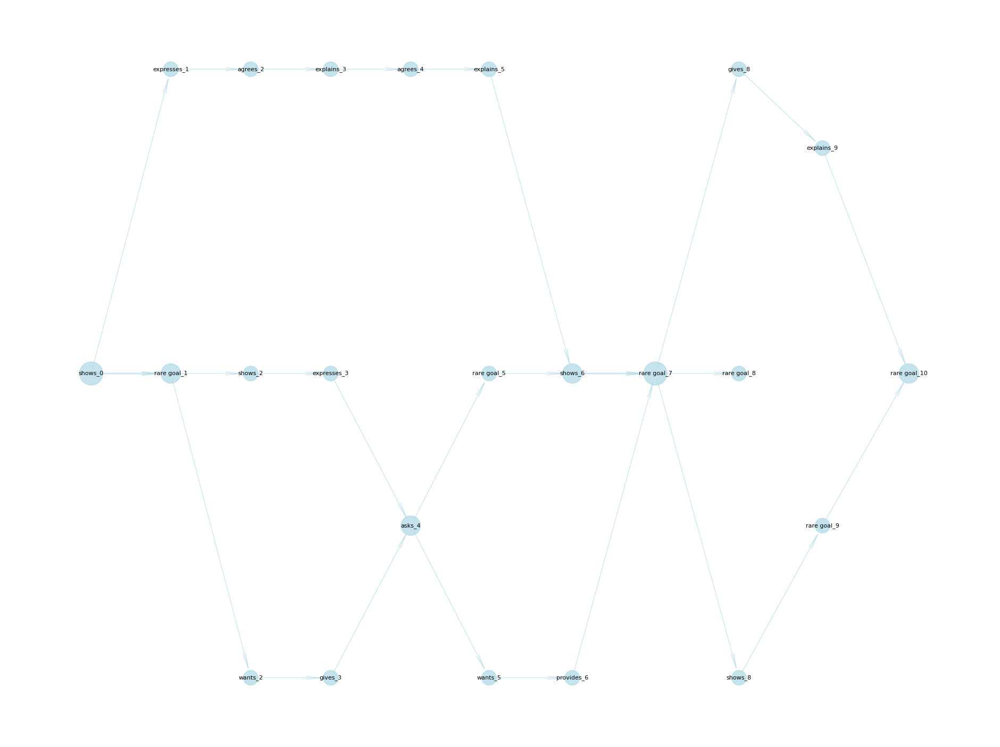

{'gives_0': 'gives_0', 'asks_1': 'asks_1', 'rare goal_1': 'rare goal_1', 'rare goal_2': 'rare goal_2', 'expresses_3': 'expresses_3', 'gives_3': 'gives_3', 'provides_3': 'provides_3', 'expresses_4': 'expresses_4', 'rare goal_4': 'rare goal_4', 'provides_5': 'provides_5', 'rare goal_6': 'rare goal_6', 'gives_7': 'gives_7', 'acknowledges_8': 'acknowledges_8'}


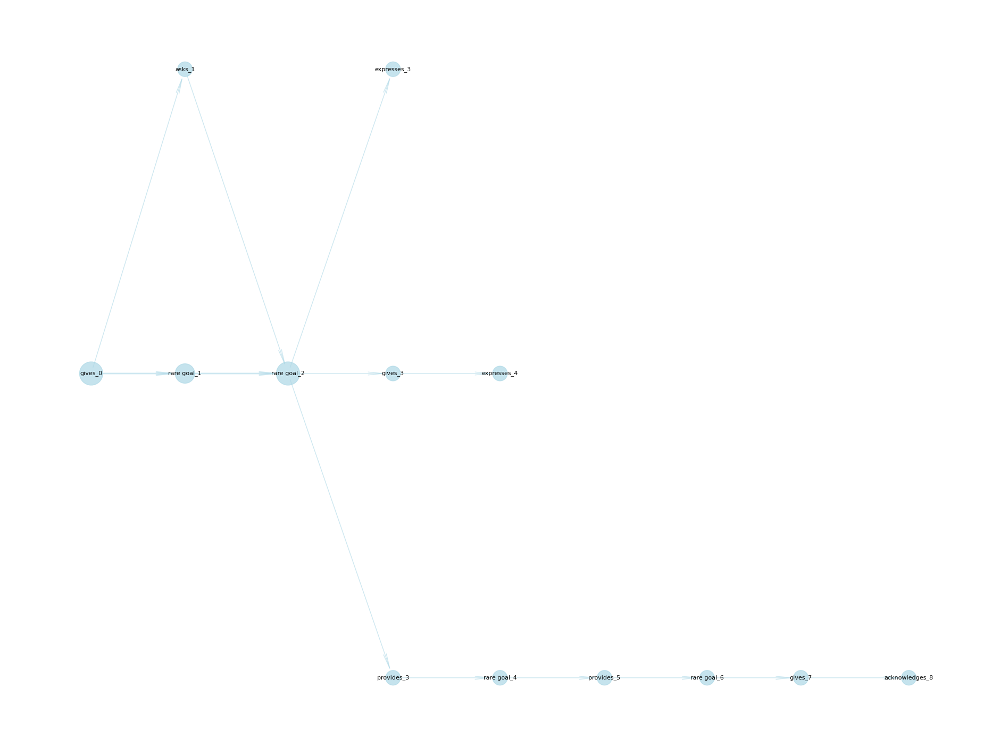

{'expresses_0': 'expresses_0', 'acknowledges_1': 'acknowledges_1', 'agrees_1': 'agrees_1', 'asks_1': 'asks_1', 'confirms_1': 'confirms_1', 'end_1': 'end_1', 'explains_1': 'explains_1', 'gives_1': 'gives_1', 'informs_1': 'informs_1', 'mentions_1': 'mentions_1', 'offers_1': 'offers_1', 'provides_1': 'provides_1', 'rare goal_1': 'rare goal_1', 'states_1': 'states_1', 'wants_1': 'wants_1', 'acknowledges_2': 'acknowledges_2', 'agrees_2': 'agrees_2', 'asks_2': 'asks_2', 'disagrees_2': 'disagrees_2', 'explains_2': 'explains_2', 'expresses_2': 'expresses_2', 'gives_2': 'gives_2', 'mentions_2': 'mentions_2', 'offers_2': 'offers_2', 'provides_2': 'provides_2', 'rare goal_2': 'rare goal_2', 'wants_2': 'wants_2', 'agrees_3': 'agrees_3', 'asks_3': 'asks_3', 'confirms_3': 'confirms_3', 'disagrees_3': 'disagrees_3', 'explains_3': 'explains_3', 'expresses_3': 'expresses_3', 'gives_3': 'gives_3', 'provides_3': 'provides_3', 'rare goal_3': 'rare goal_3', 'states_3': 'states_3', 'suggests_3': 'suggests_3

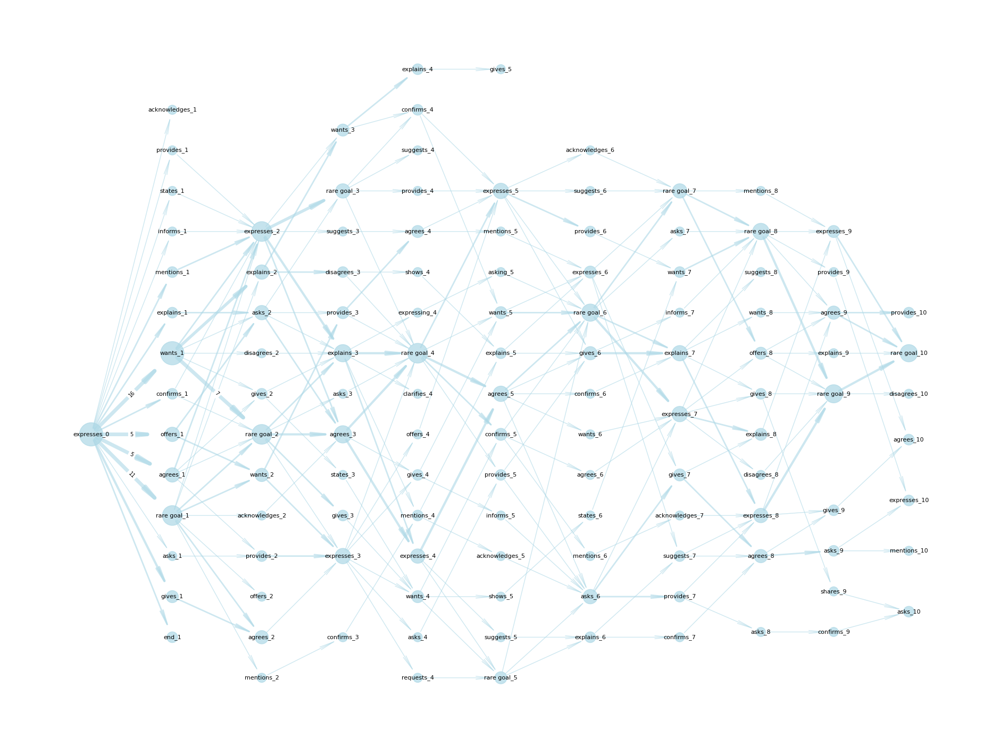

{'explains_0': 'explains_0', 'asks_1': 'asks_1', 'wants_1': 'wants_1', 'explains_2': 'explains_2', 'rare goal_2': 'rare goal_2', 'expresses_3': 'expresses_3', 'rare goal_3': 'rare goal_3', 'wants_3': 'wants_3', 'explains_4': 'explains_4', 'gives_4': 'gives_4', 'rare goal_4': 'rare goal_4', 'agrees_5': 'agrees_5', 'rare goal_5': 'rare goal_5', 'explains_6': 'explains_6', 'gives_6': 'gives_6', 'rare goal_6': 'rare goal_6', 'agrees_7': 'agrees_7', 'suggests_7': 'suggests_7', 'wants_8': 'wants_8', 'gives_9': 'gives_9', 'rare goal_9': 'rare goal_9', 'agrees_10': 'agrees_10'}


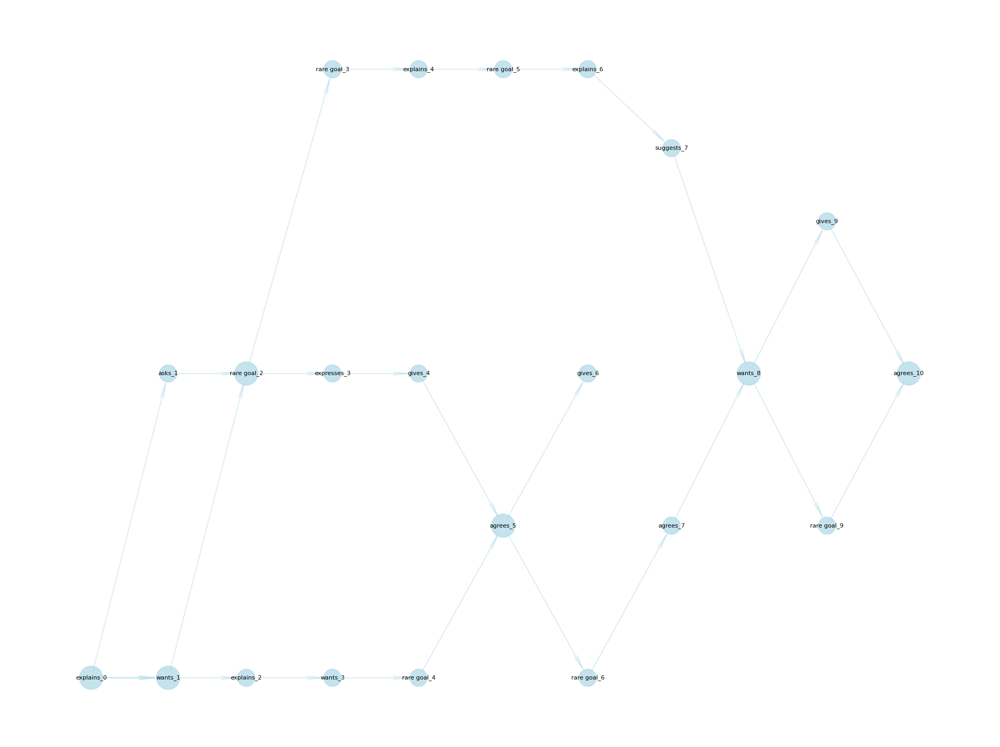

In [44]:
for dialog in dialog_dict_full:
    draw_graph(dialog_dict_full[dialog], size=(24,18))